In [1]:
from HeaderP import *
import Astraea
from sklearn import cluster, datasets, mixture
from sklearn.neighbors import kneighbors_graph
from sklearn.preprocessing import StandardScaler
from itertools import cycle, islice
import random
from tqdm import trange
import stardate

/Users/lucy/anaconda3/lib/python3.7/site-packages/sklearn/utils/__init__.py:4: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import Sequence
/Users/lucy/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:18: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import Iterable
/Users/lucy/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:16: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import Mapping, namedtuple, defaultdict, Sequence
/Users/lucy/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module 

# Gyro. model plot on data

dereddening using dustmap: dustmaps.bayestar

BV to temperature relation from: https://arxiv.org/pdf/astro-ph/9904299.pdf assuming [Fe/H]=0 and ignore the logg term. 

Model data from: https://arxiv.org/pdf/1908.00345.pdf

Gaia color to temperature from Ruth's function bprp_to_teff()

In [2]:
VD_single=np.load('VD_single.npy')
Teff_model=np.load('Teff_model.npy')
Prot=np.load('Prot_model.npy')
VD_model=np.load('VD_model.npy')
VD_single=np.load('VD_single.npy')
Teff_single=np.load('Teff_single.npy')
df=pd.read_pickle('modelTP.pkl')

In [3]:
Prot_model_1d=[]
Teff_model_1d=[]
VD_model_1d=[]

for i in range(len(VD_single)):
    for j in range(len(Teff_model[:,i])):
        if np.isnan(Prot[j,i]) or np.isnan(Teff_model[j,i]) or np.isnan(VD_model[j,i]):
            continue 
        else:
            Prot_model_1d.append(Prot[j,i])
            Teff_model_1d.append(Teff_model[j,i])
            VD_model_1d.append(VD_model[j,i])
            

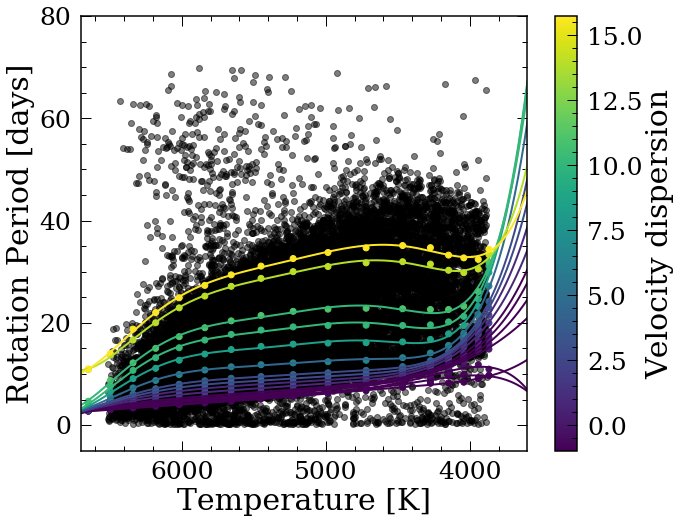

In [4]:
Model_df=pd.DataFrame(np.array((VD_single)).T,columns=['VD'])
Model_df=pd.concat([Model_df,pd.DataFrame(Prot.T,columns=['Prot'+str(i) for i in range(len(Prot))])],axis=1, sort=False)

Model_df_1d=pd.DataFrame(np.array((Teff_model_1d,Prot_model_1d,VD_model_1d)).T,columns=['Teff','Prot','VD'])

VDDic={'Prot'+str(i):Teff_single[i] for i in range(len(Prot))}

p_model=[]

for i in range(len(Model_df)):
    fitModel = np.polyfit(Teff_single, Model_df.loc[i][['Prot'+str(i) for i in range(len(Prot))]].values, 6)
    p_model.append(np.poly1d(fitModel))

    
plt.figure(figsize=(10,8))
cm = plt.cm.get_cmap('viridis',10)
v_max,v_min=max(VD_single),min(VD_single)

plt.scatter(df['teff_calc'],df['Prot'],c='k',vmax=v_max,vmin=v_min,alpha=0.5)
for i in range(len(p_model)):
    plt.plot(range(3000,7000),p_model[i](range(3000,7000)),c=cm(VD_single[i]/(v_max-v_min)))
    plt.scatter(Teff_model[:,i],Prot[:,i],c=VD_model[:,i],vmax=v_max,vmin=v_min)
    #plt.plot(Teff_model[:,i],Prot[:,i],'--',c=cm(VD_single[i]/(v_max-v_min)))
    
df=df.loc[df['teff_calc']>3300]
plt.xlim([3600,6700])
plt.ylim([-5,80])
plt.gca().invert_xaxis()
plt.ylabel('Rotation Period [days]')
plt.xlabel('Temperature [K]')
cb=plt.colorbar()
cb.set_label('Velocity dispersion')
plt.savefig('VDmodel.png')

# Mocked velocity dispersion

In [5]:
df_vd=pd.read_pickle('MockTruth.pkl')

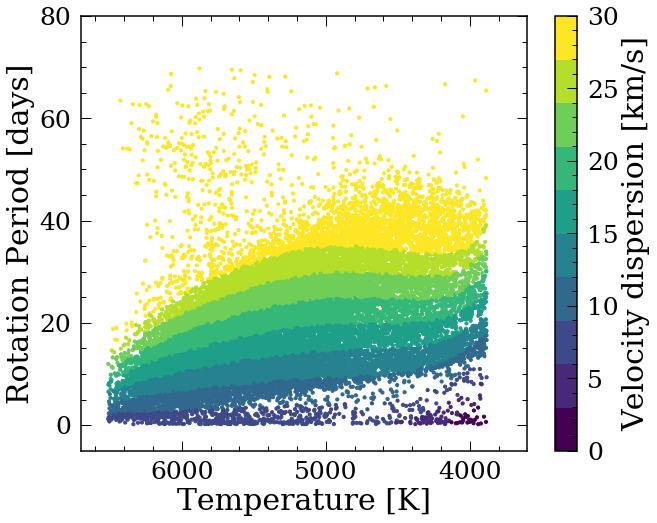

In [6]:
v_max,v_min=30,0
cm = plt.cm.get_cmap('viridis',10)
plt.figure(figsize=(10,8))
plt.scatter(df_vd['teff'],df_vd['Prot'],c=df_vd['dv_true'],s=10,vmax=v_max,vmin=0,cmap=cm,edgecolors=None)

plt.xlabel('Temperature [K]')
plt.xlim([3600,6700])
plt.ylim([-5,80])
plt.gca().invert_xaxis()
plt.ylabel('Rotation Period [days]')

cb=plt.colorbar()
cb.set_label('Velocity dispersion [km/s]')
plt.savefig('./MockTruth.png')

# Recovering VD with NN and bin methods and find the optimum bin/NN size

1.458284752887736


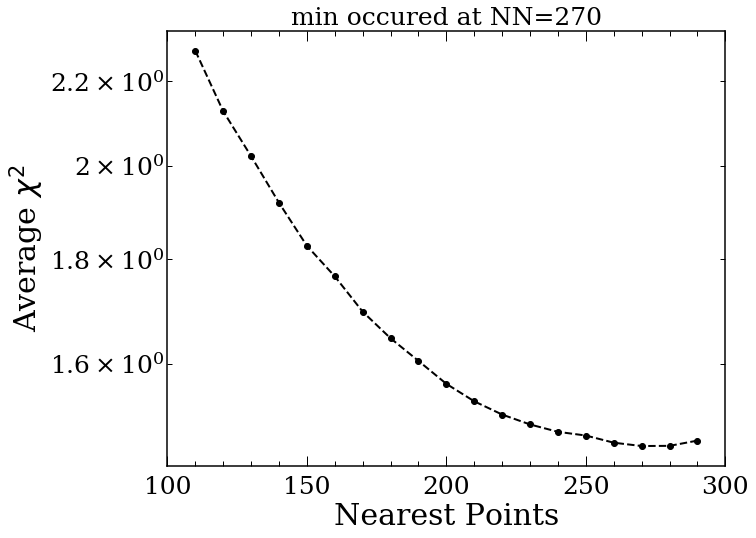

In [7]:
NNarrays=np.load('NN_test.npy')
chidq=np.load('NN_test_chidq.npy')

plt.figure(figsize=(10,8))
plt.semilogy(NNarrays[10:],chidq[10:],'ko--')
plt.ylabel('Average $\chi^2$')
plt.xlabel('Nearest Points')
oldchi=chidq[0]
minNN=0
for i in range(len(NNarrays)):
    if chidq[i]<oldchi:
        minNN=NNarrays[i]
        oldchi=chidq[i]
plt.title('min occured at NN=%d'%(minNN),fontsize=25)

print(oldchi)

plt.xlim([100,300])

plt.savefig('NN_size.png')

/Users/lucy/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


0.8243988876352031 577.2727272727273 0.1118181818181818


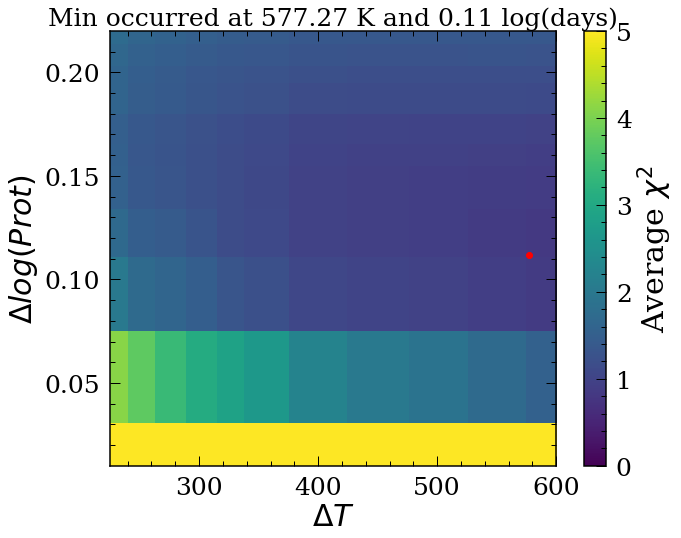

In [8]:
from scipy.interpolate import griddata

bintemps=[225,250,275,300,325,350,400,450,500,550,600]
binprots=[0.01,0.05,0.1,0.12,0.15,0.16,0.17,0.19,0.2,0.21,0.22]

data=pd.read_table('../BinTESTS',delimiter=',')
for i in bintemps:
    data['prot'].loc[data['temp']==i]=binprots

temps_a=data['temp'].values
bins_a=data['prot'].values
chidq_bin=data['chisq'].values

"""
plt.figure(figsize=(10,8))
cm = plt.cm.get_cmap('viridis',15)
plt.scatter(temps_a,bins_a,c=chidq_bin,cmap=cm,s=100)
cb=plt.colorbar()
cb.set_label('$\chi^2$')
"""
temp_g=np.linspace(min(bintemps),max(bintemps),100)
rot_g=np.linspace(min(binprots),max(binprots),100)
grid_x, grid_y = np.meshgrid(temp_g,rot_g)

points=np.zeros((len(temps_a),2))
points[:,0]=temps_a
points[:,1]=bins_a
grid_z1 = griddata(points, chidq_bin, (grid_x, grid_y), method='nearest')


temp_min=0
Prot_min=0
grid_z1=grid_z1.T
oldele=grid_z1[0][0]

finali=0
finalj=0
for i in range(len(grid_z1)):
    for j in range(len(grid_z1[i])):
        if grid_z1[i,j]<oldele:
            finali=i
            finalj=j
            temp_min=temp_g[i]
            Prot_min=rot_g[j]
            oldele=grid_z1[i,j]
print(oldele,temp_min,Prot_min)


plt.figure(figsize=(10,8))
plt.imshow(grid_z1.T, extent=(min(bintemps),max(bintemps),min(binprots),max(binprots)), origin='lower', aspect='auto',vmin=0,vmax=5)
plt.plot(temp_min,Prot_min,'ro')
plt.xlabel('$\Delta T$')
plt.ylabel('$\Delta log(Prot)$')
cb=plt.colorbar()
cb.set_label('Average $\chi^2$')
plt.title('Min occurred at %.2f K and %.2f log(days)'%(temp_min,Prot_min),fontsize=25)
plt.savefig('binsize.png')


# Recover velocity dispersion using the best parameters

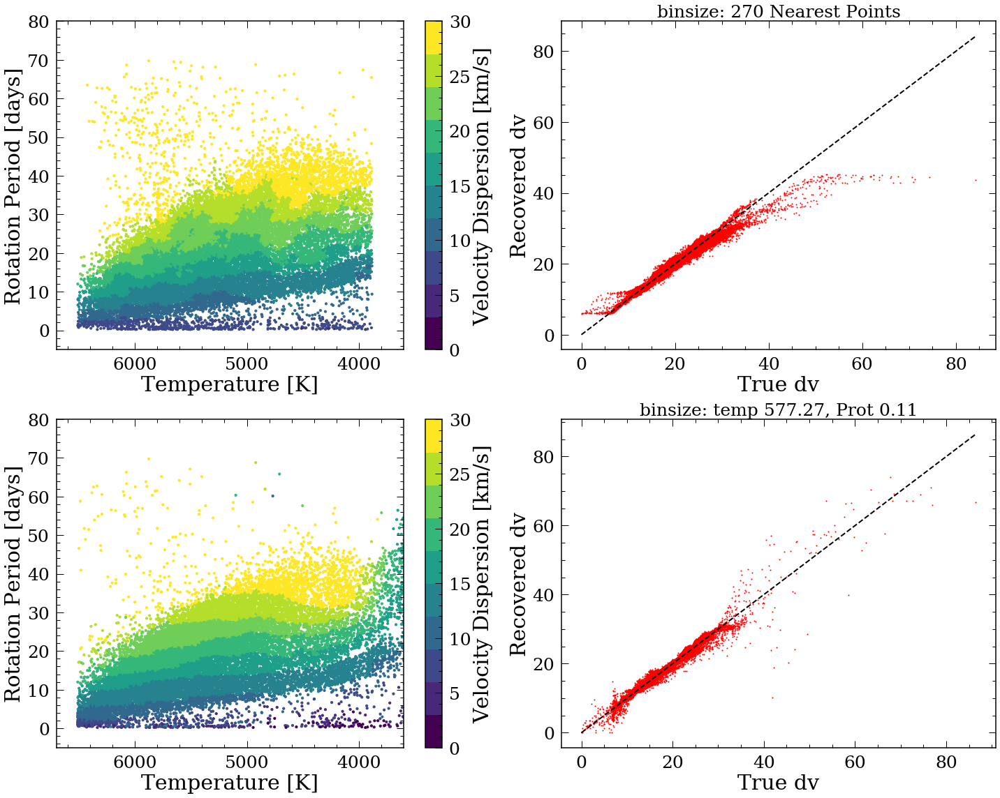

In [9]:
recover_nn=pd.read_pickle('recover_nn.pkl')
recover_bin=pd.read_pickle('recover_bin.pkl')

cm = plt.cm.get_cmap('viridis',10)
plt.figure(figsize=(20,16))
plt.subplot(2,2,1)
plt.scatter(recover_nn['teff'],recover_nn['Prot'],c=recover_nn['dv_recover'],
            vmax=30,vmin=0,s=10,cmap=cm,edgecolors=None)

plt.xlabel('Temperature [K]')
plt.xlim([3600,6700])
plt.ylim([-5,80])
plt.gca().invert_xaxis()
plt.ylabel('Rotation Period [days]')

cb=plt.colorbar()
cb.set_label('Velocity Dispersion [km/s]')

plt.subplot(2,2,2)
plt.scatter(recover_nn['dv_true'],recover_nn['dv_recover'],s=1,c='r')
plt.plot([min(recover_nn['dv_true']),max(recover_nn['dv_true'])],
         [min(recover_nn['dv_true']),max(recover_nn['dv_true'])],'k--')
plt.title('binsize: %d Nearest Points'%(270),fontsize=25)
plt.ylabel('Recovered dv')
plt.xlabel('True dv')

plt.subplot(2,2,3)
plt.scatter(recover_bin['teff'],recover_bin['Prot'],c=recover_bin['dv_recover'],
            vmax=30,vmin=0,s=10,cmap=cm,edgecolors=None)

plt.xlabel('Temperature [K]')
plt.xlim([3600,6700])
plt.ylim([-5,80])
plt.gca().invert_xaxis()
plt.ylabel('Rotation Period [days]')

cb=plt.colorbar()
cb.set_label('Velocity Dispersion [km/s]')

plt.subplot(2,2,4)
plt.scatter(recover_bin['dv_true'],recover_bin['dv_recover'],s=1,c='r')
plt.plot([min(recover_bin['dv_true']),max(recover_bin['dv_true'])],
         [min(recover_bin['dv_true']),max(recover_bin['dv_true'])],'k--')
plt.title('binsize: temp %.2f, Prot %.2f'%(577.27,0.11),fontsize=25)
plt.ylabel('Recovered dv')
plt.xlabel('True dv')
plt.tight_layout()
plt.savefig('Recovering_bin_nn.png')


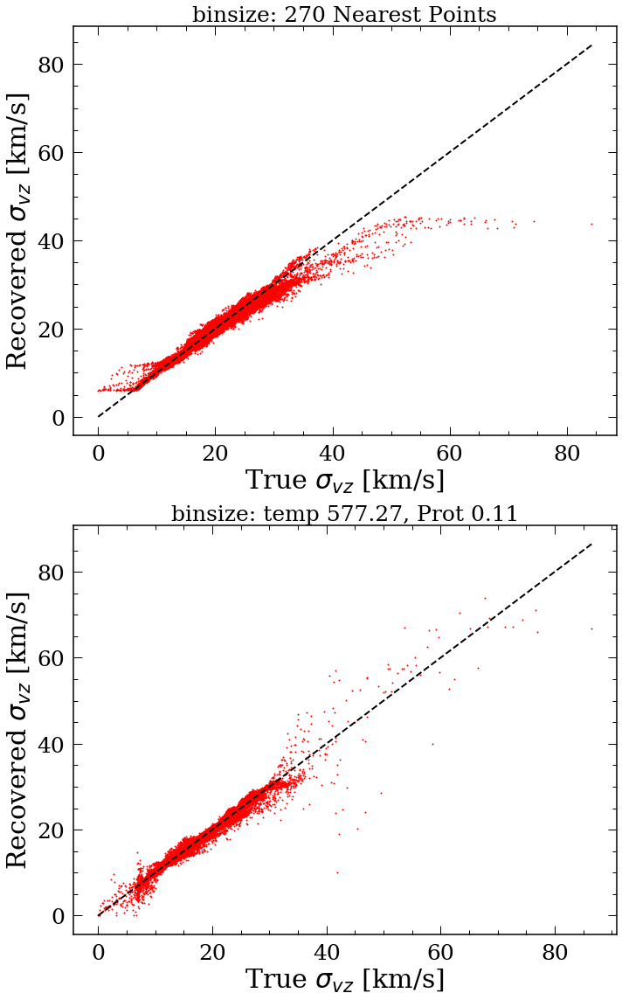

In [10]:
recover_nn=pd.read_pickle('recover_nn.pkl')
recover_bin=pd.read_pickle('recover_bin.pkl')

cm = plt.cm.get_cmap('viridis',10)
plt.figure(figsize=(10,16))
plt.subplot(2,1,1)
plt.scatter(recover_nn['dv_true'],recover_nn['dv_recover'],s=1,c='r')
plt.plot([min(recover_nn['dv_true']),max(recover_nn['dv_true'])],
         [min(recover_nn['dv_true']),max(recover_nn['dv_true'])],'k--')
plt.title('binsize: %d Nearest Points'%(270),fontsize=25)
plt.ylabel('Recovered $\sigma_{vz}$ [km/s]')
plt.xlabel('True $\sigma_{vz}$ [km/s]')

plt.subplot(2,1,2)
plt.scatter(recover_bin['dv_true'],recover_bin['dv_recover'],s=1,c='r')
plt.plot([min(recover_bin['dv_true']),max(recover_bin['dv_true'])],
         [min(recover_bin['dv_true']),max(recover_bin['dv_true'])],'k--')
plt.title('binsize: temp %.2f, Prot %.2f'%(577.27,0.11),fontsize=25)
plt.ylabel('Recovered $\sigma_{vz}$ [km/s]')
plt.xlabel('True $\sigma_{vz}$ [km/s]')
plt.tight_layout()
plt.savefig('Recovering_bin_nn.png')



# Use bin method to get age

## For Prot

In [7]:
#df_isoages=pd.read_table('../GKSPCPapTable2.txt',delimiter='&')
#IAcomp=pd.merge(df_isoages,df_bin,left_on='KIC',right_on='KID',how='inner')



In [8]:
#IAcomp=IAcomp.loc[IAcomp['iso_age_x']<10]
#IAcomp=IAcomp.loc[IAcomp['iso_age_err1_x']<3]


In [9]:
#plt.scatter(IAcomp['color_teffs'],IAcomp['abs_G'],c=IAcomp['kin_age'],s=10,vmin=0,vmax=9,cmap=cm,edgecolors=None)
#plt.gca().invert_xaxis()
#plt.gca().invert_yaxis()


In [10]:
df_bin['v_b'].hist()

NameError: name 'df_bin' is not defined

(29949, 258)
(29949, 258)
Stars with z>0.27 kpc: 0.14023840528899129


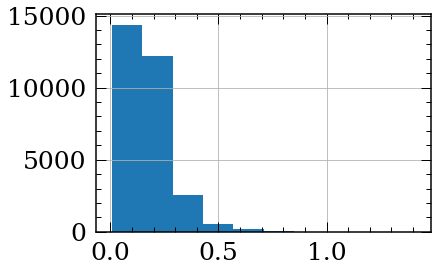

In [38]:
#fname_bin='df_ruth.pkl'
fname_bin='Kinages_Prot.pkl'
#df_bin.to_pickle('../'+fname_bin)

df_bin=pd.read_pickle('../'+fname_bin)
print(np.shape(df_bin))
df_bin=df_bin.dropna(subset=['kin_age','iso_age'])
print(np.shape(df_bin))
df_bin.z.hist()
print('Stars with z>0.27 kpc:',sum(df_bin.z>0.270)/len(df_bin))

In [8]:
np.median(np.sqrt(df_bin['kin_age_err']**2+df_bin['kin_age_err_AVR']**2))

1.9767477352042038

In [39]:
list(df_bin.columns)

['KIC_x',
 'iso_mass',
 'iso_mass_err1',
 'iso_mass_err2',
 'iso_teff',
 'iso_teff_err1',
 'iso_teff_err2',
 'iso_logg',
 'iso_logg_err1',
 'iso_logg_err2',
 'iso_feh',
 'iso_feh_err1',
 'iso_feh_err2',
 'iso_rad',
 'iso_rad_err1',
 'iso_rad_err2',
 'iso_rho',
 'iso_rho_err1',
 'iso_rho_err2',
 'iso_lum',
 'iso_lum_err1',
 'iso_lum_err2',
 'iso_age',
 'unReAgeFlag',
 'iso_age_err1',
 'iso_age_err2',
 'iso_dis',
 'iso_dis_err1',
 'iso_dis_err2',
 'iso_avs',
 'iso_gof',
 'TAMS\\\\',
 'Unnamed: 0',
 'Unnamed: 0_x',
 'kepid',
 'Mass_berger',
 'KIC_y',
 'Kp',
 'Q',
 'Teff_santos',
 'E_Teff',
 'e_Teff',
 'logg_santos',
 'E_logg',
 'e_logg',
 'M',
 'E_M',
 'e_M',
 'Prot_santos',
 'E_Prot',
 'Sph',
 'E_Sph',
 'flag1',
 'DMK',
 'flag2',
 'flag3',
 'flag4',
 'flag5',
 'Unnamed: 0.1_x',
 'KID',
 'Teff',
 'loggKIC',
 'Mass',
 'Prot',
 'Prot_err',
 'Rper',
 'LPH',
 'w',
 'DC',
 'Flag',
 'designation',
 'source_id',
 'gaia_ref_epoch',
 'ra',
 'ra_error',
 'dec',
 'dec_error',
 'parallax',
 'parallax

In [49]:
df_bin['kin_age_err_t']=np.sqrt(df_bin['kin_age_err']**2+df_bin['kin_age_err_AVR']**2)
columns=['kepid','Prot','Prot_err','source_id','ra','ra_error','dec','dec_error','all_vz','vz_err_all','vel_dis',
        'kin_age','kin_age_err_AVR','kin_age_err','kin_age_err_t','Ro','teff_calc','abs_G']
df_bin[columns].to_csv('Gyrokinage2020_Prot.csv',index=False)


In [47]:
np.median(df_bin['kin_age_err_t'])

1.9767477352042038

In [4]:
mpf = '../aviary/data/metal_poor_avr.csv'
mrf = '../aviary/data/metal_rich_avr.csv'
af = '../aviary/data/all_stars_avr.csv'

mr = pd.read_csv(mrf)

slopes=np.zeros(5000)
inter=np.zeros(5000)
for i in trange(5000):
    newvz=np.array([np.random.normal(mr.sigma_z_kms[k], mr.sigma_z_err[k],1)[0] for k in range(len(mr.sigma_z_kms))])
    newage=np.array([np.random.normal(mr.Age_Gyr[k], mr.age_err[k],1)[0] for k in range(len(mr.age_err))])
    
    newvz=newvz[newage>0]
    newage=newage[newage>0]
    
    p_mr = np.polyfit(np.log(newvz), np.log(newage), 1)
    slopes[i]=p_mr[0]
    inter[i]=p_mr[1]


100%|██████████| 5000/5000 [00:09<00:00, 526.77it/s]


In [5]:
#mr

In [6]:
p_mr=np.polyfit(np.log(mr.sigma_z_kms), np.log(mr.Age_Gyr), 1)

In [7]:
p_mr

array([ 1.57511484, -2.79934192])

In [8]:
[np.std(slopes), np.std(inter)]

[0.19291731369278983, 0.5331409261731497]

In [13]:
for i in trange(5000):
    newvz=np.array([np.random.normal(mr.sigma_z_kms[k], mr.sigma_z_err[k],1)[0] for k in range(len(mr.sigma_z_kms))])
    newage=np.array([np.random.normal(mr.Age_Gyr[k], mr.age_err[k],1)[0] for k in range(len(mr.age_err))])
    
    newvz=newvz[newage>0]
    newage=newage[newage>0]
    
    p_mr = np.polyfit(np.log(newvz), np.log(newage), 1)
    slopes[i]=p_mr[0]
    inter[i]=p_mr[1]

100%|██████████| 5000/5000 [00:10<00:00, 493.35it/s]


In [14]:
def v_to_age(v, coeffs):
    """
    Convert z velocity dispersion [km/s] to age [Gyr]
    Args:
        v (array): Z Velocity dispersion [km/s].
        coeffs (array): coefficients for straight line fit. [intercept, slope]
    Returns:
        age (array): age in Gyr.
    """
    b, a = coeffs
    logt = np.polyval(coeffs, np.log(v))
    return np.exp(logt)

In [15]:
np.median(df_bin['kin_age_err'])

1.2952062163891673

In [16]:
df_bin['kin_age_err_AVR']=((v_to_age(df_bin['vel_dis'],p_mr+[np.std(slopes), 0]))-
                              (v_to_age(df_bin['vel_dis'],p_mr-[np.std(slopes), 0])))/2

In [17]:
np.median(df_bin['kin_age_err_AVR'])

1.3961718198497806

In [18]:
df_bin['kin_age_err']=np.sqrt(df_bin['kin_age_err']**2.+df_bin['kin_age_err_AVR']**2)

In [19]:
np.median(df_bin['kin_age_err'])

1.9953847556508857

1.9953847556508857

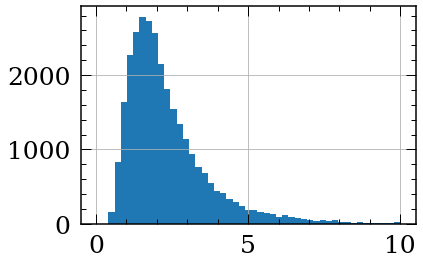

In [20]:
df_bin['kin_age_err'].hist(bins=np.linspace(0,10,50))
np.median(df_bin['kin_age_err'])

29949


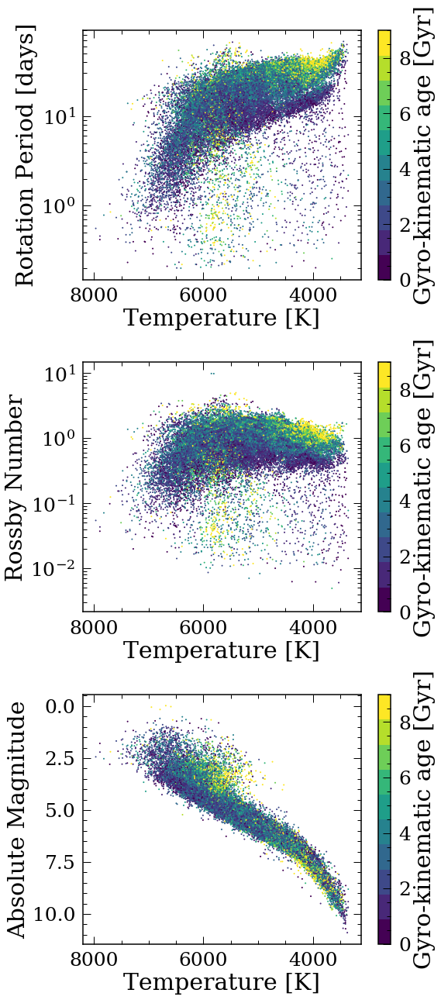

In [21]:
plt.figure(figsize=(8,18))
cm = plt.cm.get_cmap('viridis',10)
plt.subplot(3,1,1)
plt.scatter(df_bin['color_teffs'],df_bin['Prot'],c=df_bin['kin_age'],s=1,vmin=0,vmax=9,cmap=cm,edgecolors=None)

plt.xlabel('Temperature [K]')
plt.gca().invert_xaxis()
plt.ylabel('Rotation Period [days]')

cb=plt.colorbar()
cb.set_label('Gyro-kinematic age [Gyr]')
#plt.title('Ages of stars in McQuillian2014+',fontsize=25)
plt.yscale('log')


plt.subplot(3,1,2)
plt.scatter(df_bin['color_teffs'],df_bin['Ro'],c=df_bin['kin_age'],s=1,vmin=0,vmax=9,cmap=cm,edgecolors=None)

plt.xlabel('Temperature [K]')
plt.gca().invert_xaxis()
plt.ylabel('Rossby Number')

cb=plt.colorbar()
cb.set_label('Gyro-kinematic age [Gyr]')
#plt.title('Ages Errors',fontsize=25)
plt.tight_layout()
plt.yscale('log')

plt.subplot(3,1,3)
plt.scatter(df_bin['color_teffs'],df_bin['abs_G'],c=df_bin['kin_age'],s=1,vmin=0,vmax=9,cmap=cm,edgecolors=None)

plt.xlabel('Temperature [K]')
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()
plt.ylabel('Absolute Magnitude')

cb=plt.colorbar()
cb.set_label('Gyro-kinematic age [Gyr]')
plt.tight_layout()
#plt.yscale('log')

plt.savefig('Age_recover.png')
print(len(df_bin))


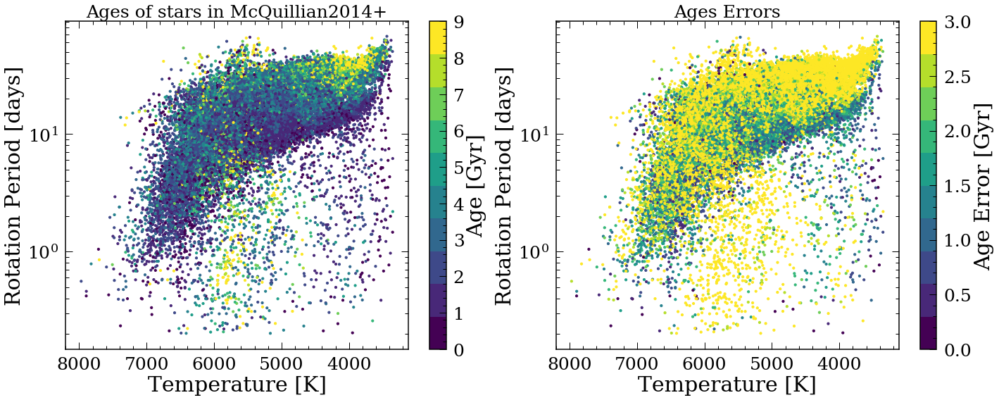

In [125]:
plt.figure(figsize=(20,8))
cm = plt.cm.get_cmap('viridis',10)
plt.subplot(1,2,1)
plt.scatter(df_bin['color_teffs'],df_bin['Prot'],c=df_bin['kin_age'],s=10,vmin=0,vmax=9,cmap=cm,edgecolors=None)

plt.xlabel('Temperature [K]')
plt.gca().invert_xaxis()
plt.ylabel('Rotation Period [days]')

cb=plt.colorbar()
cb.set_label('Age [Gyr]')
plt.title('Ages of stars in McQuillian2014+',fontsize=25)
plt.yscale('log')
plt.subplot(1,2,2)
plt.scatter(df_bin['color_teffs'],df_bin['Prot'],c=df_bin['kin_age'],s=10,vmin=0,vmax=3,cmap=cm,edgecolors=None)

plt.xlabel('Temperature [K]')
plt.gca().invert_xaxis()
plt.ylabel('Rotation Period [days]')

cb=plt.colorbar()
cb.set_label('Age Error [Gyr]')
plt.title('Ages Errors',fontsize=25)
plt.tight_layout()
plt.yscale('log')
plt.savefig('Age_recover.png')


## Ages for stars with predicted Prot

In [7]:
fname_bin='KinageAllKepler_cut.pkl'


df_bin_rotrvar=pd.read_pickle('../'+fname_bin)
print(len(df_bin_rotrvar))


df_bin_rotrvar=df_bin_rotrvar.dropna(subset=['kin_age','kin_age_err'])

"""
#df_bin_rotrvar=df_bin_rotrvar.loc[df_bin_rotrvar['abs_G']>4]
df_bin_rotrvar['kin_age_err_AVR']=((v_to_age(df_bin_rotrvar['vel_dis'],p_mr+[np.std(slopes), 0]))-
                              (v_to_age(df_bin_rotrvar['vel_dis'],p_mr-[np.std(slopes), 0])))/2
#df_bin_rotrvar.to_pickle('../'+fname_bin)
"""
df_bin_rotrvar=df_bin_rotrvar.loc[df_bin_rotrvar['abs_G']>4]
print(len(df_bin_rotrvar))

154965
75480


In [8]:
df_bin_rotrvar.loc[df_bin_rotrvar['kepid'].isin([5342558.0,7732146.0,11822514.0,12456401.0,11075611.0])]

,solution_id,designation,source_id,random_index,gaia_ref_epoch,ra,ra_error,dec,dec_error,parallax,...,all_vz_new,kin_age_err,nostars,vz_err,vz_err_all,teff_calc_new,v_b_new,kin_age_mix,kin_age_mix_err,kin_age_err_AVR
131597,1.635721e+18,Gaia DR2 2131212769993943424,2.131213e+18,849548289.0,2015.5,287.239176,0.056588,48.639353,0.063015,5.348267,...,NaN,2.917989,NaN,NaN,NaN,3470.083547,-9.724118,4.887510,1.827107,4.796936
154941,NaN,Gaia DR2 2133253566654141952,2.133254e+18,NaN,2015.5,289.193889,0.022955,51.352775,0.028194,5.151005,...,11.351997,3.494174,21.0,NaN,5.426515,3679.337541,7.896666,3.081296,1.687988,2.304111


In [9]:
list(df_bin_rotrvar.columns)

['solution_id',
 'designation',
 'source_id',
 'random_index',
 'gaia_ref_epoch',
 'ra',
 'ra_error',
 'dec',
 'dec_error',
 'parallax',
 'parallax_error',
 'parallax_over_error',
 'pmra',
 'pmra_error',
 'pmdec',
 'pmdec_error',
 'ra_dec_corr',
 'ra_parallax_corr',
 'ra_pmra_corr',
 'ra_pmdec_corr',
 'dec_parallax_corr',
 'dec_pmra_corr',
 'dec_pmdec_corr',
 'parallax_pmra_corr',
 'parallax_pmdec_corr',
 'pmra_pmdec_corr',
 'astrometric_n_obs_al',
 'astrometric_n_obs_ac',
 'astrometric_n_good_obs_al',
 'astrometric_n_bad_obs_al',
 'astrometric_gof_al',
 'astrometric_chi2_al',
 'astrometric_excess_noise',
 'astrometric_excess_noise_sig',
 'astrometric_params_solved',
 'astrometric_primary_flag',
 'astrometric_weight_al',
 'astrometric_pseudo_colour',
 'astrometric_pseudo_colour_error',
 'mean_varpi_factor_al',
 'astrometric_matched_observations',
 'visibility_periods_used',
 'astrometric_sigma5d_max',
 'frame_rotator_object_type',
 'matched_observations',
 'duplicated_source',
 'phot_g

In [52]:
df_bin_rotrvar['kin_age_err_t']=np.sqrt(df_bin_rotrvar['kin_age_mix_err']**2+df_bin_rotrvar['kin_age_err_AVR']**2)
columns=['kepid','Prot_predict','source_id','ra','ra_error','dec','dec_error','v_b','v_b_err','vel_dis',
        'kin_age_mix','kin_age_err_AVR','kin_age_mix_err','kin_age_err_t','Ro','teff_calc','abs_G']
df_bin_rotrvar[columns].to_csv('Gyrokinage2020_All.csv',index=False)



In [24]:
df_bin_rotrvar['kin_age_err']=np.sqrt(df_bin_rotrvar['kin_age_err_AVR']**2+df_bin_rotrvar['kin_age_err']**2)


(0, 50000)

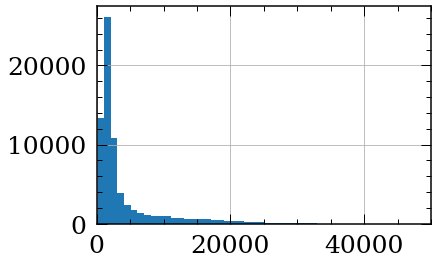

In [25]:
df_bin_rotrvar['Rvar'].hist(bins=100)
plt.xlim([0,50000])

In [26]:
np.median(df_bin_rotrvar['kin_age_err'])

4.609460558741478

In [27]:
#v_to_age(df_bin_rotrvar['vel_dis'],p_mr)-df_bin_rotrvar['kin_age']


In [28]:
#df_bin_rotrvar['vel_disp']

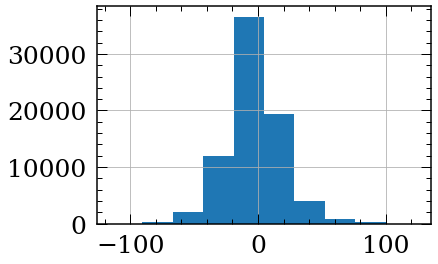

In [29]:
df_bin_rotrvar['v_b'].hist()

In [30]:
np.median(df_bin_rotrvar['feh'])

-0.12

In [31]:
sum(df_bin_rotrvar['feh']<-0.2)/len(df_bin_rotrvar['feh'])

0.35315315315315315

In [10]:
z=[ 7.43269812e-21,-2.85871860e-16 ,4.37669326e-12,-3.47574268e-08,1.52548746e-04,
   -3.54673368e-01,3.51882114e+02]
p = np.poly1d(z)

In [32]:
from stardate.lhf import gk_rotation_model
with fits.open('../../FirstYearML/kepler_dr2_1arcsec.fits') as data_ga:
    print(np.shape(data_ga[1].data))
    gaia = pd.DataFrame(data_ga[1].data, dtype="float64")
#print(gaia)

ASstars=pd.read_table('/Users/lucy/Desktop/KeplerAges/ASage.webarchive',delimiter=',',skiprows=2)
ASstars=ASstars.dropna(subset=['KIC'])

seismicKID=[12069424,12069449,3427720,3656476,5184732,6116048,6196457,6521045,7680114,7871531,8006161,8349582,
           9098294,9139151,9955598,10454113,10586004,10644253,10963065,11244118,11401755]

seismicAge=[7.07,6.82,2.23,8.13,4.17,6.23,5.51,6.24,7.19,9.15,5.04,7.93,7.28,1.71,6.43,2.03,6.35,
            1.07,4.36,6.43,5.85]
seismicAge_err=[0.46,0.28,0.17,0.59,0.40,0.37,0.71,0.37,0.70,0.47,0.17,0.94,0.51,0.19,0.47,0.29,
                1.37,0.25,0.46,0.58,0.93]


for i in ASstars['KIC'].unique():
    AS_single=ASstars.loc[ASstars['KIC']==i]
    seismicKID.append(int(i))
    seismicAge.append(np.mean(AS_single['Age']))
    seismicAge_err.append((max(AS_single['Age'])-min(AS_single['Age']))/2.)

ASstars_van=pd.read_table('/Users/lucy/Desktop/KeplerAges/VanSand.txt',delimiter=',')

seismicKID=np.append(seismicKID,ASstars_van['KIC'].values)    
seismicAge=np.append(seismicAge,ASstars_van['AMP_age'].values)    
seismicAge_err=np.append(seismicAge_err,ASstars_van['AMP_age_err'].values)    
    
All_ASstars=pd.DataFrame(np.array((seismicKID,seismicAge,seismicAge_err)).T,
                        columns=['KID','ASAge','ASAge_err'])


All_ASstars=pd.merge(All_ASstars,gaia,left_on='KID',right_on='kepid',how='inner')
All_ASstars=All_ASstars.drop_duplicates(keep='first')
print(np.shape(All_ASstars))

pred_period = 10**gk_rotation_model(np.log10(All_ASstars.ASAge.values*1e9), All_ASstars.phot_bp_mean_mag - All_ASstars.phot_rp_mean_mag)
All_ASstars['predict_period']=pred_period



(201312,)
(86, 137)


In [33]:
asstars= pd.merge(All_ASstars[['KID','predict_period']],df_bin_rotrvar,left_on='KID',right_on='KID',how='inner')
#asstars=asstars.loc[abs(asstars['predict_period']-asstars['Prot_predict'])<5]
asstars


,KID,predict_period,solution_id,designation,source_id,random_index,gaia_ref_epoch,ra,ra_error,dec,...,all_vz_new,kin_age_err,nostars,vz_err,vz_err_all,teff_calc_new,v_b_new,kin_age_mix,kin_age_mix_err,kin_age_err_AVR
0,12069424.0,34.518144,1.635721e+18,Gaia DR2 2135550755683405952,2.135551e+18,4.015756e+08,2015.5,295.452970,0.030352,50.524376,...,NaN,6.465567,NaN,NaN,NaN,5825.220080,6.051577,9.349054,2.421727,5.994898
1,12069424.0,34.213746,1.635721e+18,Gaia DR2 2135550755683405952,2.135551e+18,4.015756e+08,2015.5,295.452970,0.030352,50.524376,...,NaN,6.465567,NaN,NaN,NaN,5825.220080,6.051577,9.349054,2.421727,5.994898
2,12069449.0,34.803445,1.635721e+18,Gaia DR2 2135550755683407232,2.135551e+18,1.660575e+08,2015.5,295.465642,0.022583,50.516824,...,NaN,4.103338,NaN,NaN,NaN,5644.172145,4.703658,4.067831,3.502147,2.138305
3,12069449.0,35.685559,1.635721e+18,Gaia DR2 2135550755683407232,2.135551e+18,1.660575e+08,2015.5,295.465642,0.022583,50.516824,...,NaN,4.103338,NaN,NaN,NaN,5644.172145,4.703658,4.067831,3.502147,2.138305
4,3427720.0,12.137496,1.635721e+18,Gaia DR2 2099985402815368704,2.099985e+18,1.356349e+09,2015.5,286.438256,0.021006,38.522628,...,NaN,2.481207,NaN,NaN,NaN,6115.418159,12.053505,3.216167,1.905726,1.588897
5,3427720.0,12.488758,1.635721e+18,Gaia DR2 2099985402815368704,2.099985e+18,1.356349e+09,2015.5,286.438256,0.021006,38.522628,...,NaN,2.481207,NaN,NaN,NaN,6115.418159,12.053505,3.216167,1.905726,1.588897
6,6116048.0,22.668568,1.635721e+18,Gaia DR2 2101479879638683392,2.101480e+18,1.478259e+09,2015.5,289.442885,0.023221,41.410553,...,NaN,4.485204,NaN,NaN,NaN,5967.310786,26.101957,6.152425,2.697807,3.583140
7,6116048.0,23.239946,1.635721e+18,Gaia DR2 2101479879638683392,2.101480e+18,1.478259e+09,2015.5,289.442885,0.023221,41.410553,...,NaN,4.485204,NaN,NaN,NaN,5967.310786,26.101957,6.152425,2.697807,3.583140
8,7871531.0,51.447232,1.635721e+18,Gaia DR2 2105298788456363008,2.105299e+18,1.032281e+09,2015.5,282.914803,0.242053,43.635948,...,NaN,14.141944,NaN,NaN,NaN,5478.659657,6.443490,2.315350,1.693053,13.400648
9,7871531.0,52.210697,1.635721e+18,Gaia DR2 2105298788456363008,2.105299e+18,1.032281e+09,2015.5,282.914803,0.242053,43.635948,...,NaN,14.141944,NaN,NaN,NaN,5478.659657,6.443490,2.315350,1.693053,13.400648


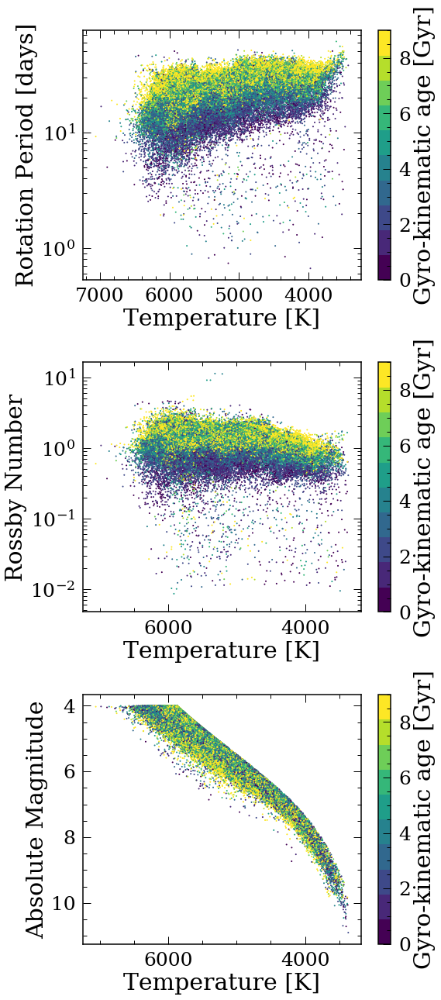

In [13]:
m1=df_bin_rotrvar['abs_G']<p(df_bin_rotrvar['teff_calc'])-0.3
plt.figure(figsize=(8,18))
cm = plt.cm.get_cmap('viridis',10)
plt.subplot(3,1,1)
plt.scatter(df_bin_rotrvar['teff_calc'][~m1],df_bin_rotrvar['Prot_predict'][~m1],c=df_bin_rotrvar['kin_age'][~m1],s=1,vmin=0,vmax=9,cmap=cm,edgecolors=None)
#plt.plot(asstars['teff_calc'],asstars['Prot_predict'],'ko')
plt.xlabel('Temperature [K]')
plt.gca().invert_xaxis()
plt.ylabel('Rotation Period [days]')

cb=plt.colorbar()
cb.set_label('Gyro-kinematic age [Gyr]')
#plt.title('Ages of stars in McQuillian2014+',fontsize=25)
plt.yscale('log')


plt.subplot(3,1,2)
plt.scatter(df_bin_rotrvar['teff_calc'][~m1],df_bin_rotrvar['Ro'][~m1],c=df_bin_rotrvar['kin_age'][~m1],s=1,vmin=0,vmax=9,cmap=cm,edgecolors=None)
#plt.plot(asstars['teff_calc'],asstars['Ro'],'ko')
plt.xlabel('Temperature [K]')
plt.gca().invert_xaxis()
plt.ylabel('Rossby Number')

cb=plt.colorbar()
cb.set_label('Gyro-kinematic age [Gyr]')
#plt.title('Ages Errors',fontsize=25)
plt.tight_layout()
plt.yscale('log')

plt.subplot(3,1,3)
plt.scatter(df_bin_rotrvar['teff_calc'][~m1],df_bin_rotrvar['abs_G'][~m1],c=df_bin_rotrvar['kin_age'][~m1],s=1,vmin=0,vmax=9,cmap=cm,edgecolors=None)
#plt.plot(asstars['teff_calc'],asstars['abs_G'],'ko')
plt.xlabel('Temperature [K]')
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()
plt.ylabel('Absolute Magnitude')

cb=plt.colorbar()
cb.set_label('Gyro-kinematic age [Gyr]')
plt.tight_layout()
#plt.yscale('log')

plt.savefig('Age_recover_predict.png')



In [ ]:
plt.figure(figsize=(20,8))
cm = plt.cm.get_cmap('viridis',10)
plt.subplot(1,2,1)
plt.scatter(df_bin_rotrvar['teff_calc'],df_bin_rotrvar['Prot_predict'],
            c=df_bin_rotrvar['kin_age'],s=10,vmin=0,vmax=10,cmap=cm,edgecolors=None)

plt.xlabel('Temperature [K]')
plt.gca().invert_xaxis()
plt.yscale('log')
plt.ylabel('Predicted Rotation Period [days]')

cb=plt.colorbar()
cb.set_label('Gyro-Kinematic Age [Gyr]')

plt.subplot(1,2,2)
plt.scatter(df_bin_rotrvar['teff_calc'],df_bin_rotrvar['abs_G'],
            c=df_bin_rotrvar['kin_age'],s=10,vmin=0,vmax=10,cmap=cm,edgecolors=None)

plt.xlabel('Temperature [K]')
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()
plt.ylabel('Absolute Magnitude')

cb=plt.colorbar()
cb.set_label('Gyro-Kinematic Age [Gyr]')
plt.tight_layout()

plt.savefig('Age_recover_rotrvar.png')



## Most accurate ages

In [5]:
list(df_bin_rotrvar.columns)

['solution_id',
 'designation',
 'source_id',
 'random_index',
 'gaia_ref_epoch',
 'ra',
 'ra_error',
 'dec',
 'dec_error',
 'parallax',
 'parallax_error',
 'parallax_over_error',
 'pmra',
 'pmra_error',
 'pmdec',
 'pmdec_error',
 'ra_dec_corr',
 'ra_parallax_corr',
 'ra_pmra_corr',
 'ra_pmdec_corr',
 'dec_parallax_corr',
 'dec_pmra_corr',
 'dec_pmdec_corr',
 'parallax_pmra_corr',
 'parallax_pmdec_corr',
 'pmra_pmdec_corr',
 'astrometric_n_obs_al',
 'astrometric_n_obs_ac',
 'astrometric_n_good_obs_al',
 'astrometric_n_bad_obs_al',
 'astrometric_gof_al',
 'astrometric_chi2_al',
 'astrometric_excess_noise',
 'astrometric_excess_noise_sig',
 'astrometric_params_solved',
 'astrometric_primary_flag',
 'astrometric_weight_al',
 'astrometric_pseudo_colour',
 'astrometric_pseudo_colour_error',
 'mean_varpi_factor_al',
 'astrometric_matched_observations',
 'visibility_periods_used',
 'astrometric_sigma5d_max',
 'frame_rotator_object_type',
 'matched_observations',
 'duplicated_source',
 'phot_g

In [44]:
df_bin=df_bin.drop_duplicates(subset='KID')

KIDs=df_bin['KID'].values

kinages=np.zeros(len(df_bin_rotrvar))
kinages_err=np.zeros(len(df_bin_rotrvar))
for i in trange(len(df_bin_rotrvar)):
    df_single=df_bin_rotrvar.iloc[i]
    if df_single['KID'] in KIDs:
        df_prot_single=df_bin.loc[df_bin['KID']==df_single['KID']]
        kinages[i]=df_prot_single['kin_age'].values
        kinages_err[i]=df_prot_single['kin_age_err'].values
    else:
        kinages[i]=df_single['kin_age']
        kinages_err[i]=df_single['kin_age_err']

df_bin_rotrvar['kin_age_mix']=kinages
df_bin_rotrvar['kin_age_mix_err']=kinages_err

100%|██████████| 75480/75480 [01:20<00:00, 939.62it/s] 


In [45]:
len(df_bin_rotrvar.dropna(subset=['kin_age_mix']))

75480

In [46]:
#df_bin_rotrvar.to_pickle('../KinageAllKepler_cut_redo.pkl')

In [14]:
df_bin_rotrvar=pd.read_pickle('../KinageAllKepler_cut_redo.pkl')

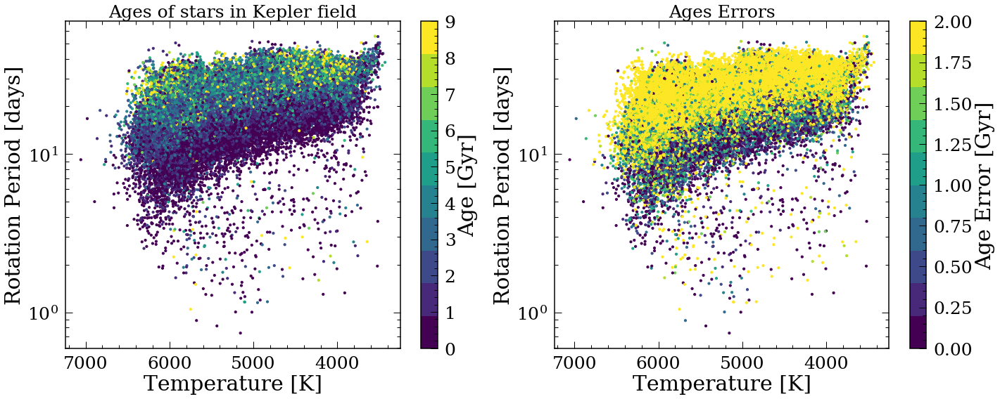

In [21]:
plt.figure(figsize=(20,8))
cm = plt.cm.get_cmap('viridis',10)
plt.subplot(1,2,1)
plt.scatter(df_bin_rotrvar['teff_calc'],df_bin_rotrvar['Prot_predict'],
            c=df_bin_rotrvar['kin_age_correct'],s=10,vmin=0,vmax=9,cmap=cm,edgecolors=None)

plt.xlabel('Temperature [K]')
plt.gca().invert_xaxis()
plt.yscale('log')
plt.ylabel('Rotation Period [days]')

cb=plt.colorbar()
cb.set_label('Age [Gyr]')
plt.title('Ages of stars in Kepler field',fontsize=25)

plt.subplot(1,2,2)
plt.scatter(df_bin_rotrvar['teff_calc'],df_bin_rotrvar['Prot_predict'],
            c=df_bin_rotrvar['kin_age_correct'],s=10,vmin=0,vmax=2,cmap=cm,edgecolors=None)

plt.xlabel('Temperature [K]')
plt.gca().invert_xaxis()
plt.ylabel('Rotation Period [days]')

cb=plt.colorbar()
plt.yscale('log')
cb.set_label('Age Error [Gyr]')
plt.title('Ages Errors',fontsize=25)

plt.tight_layout()

plt.savefig('Age_recover_ac.png')




235
3.069710693382433 2.8098270598910333


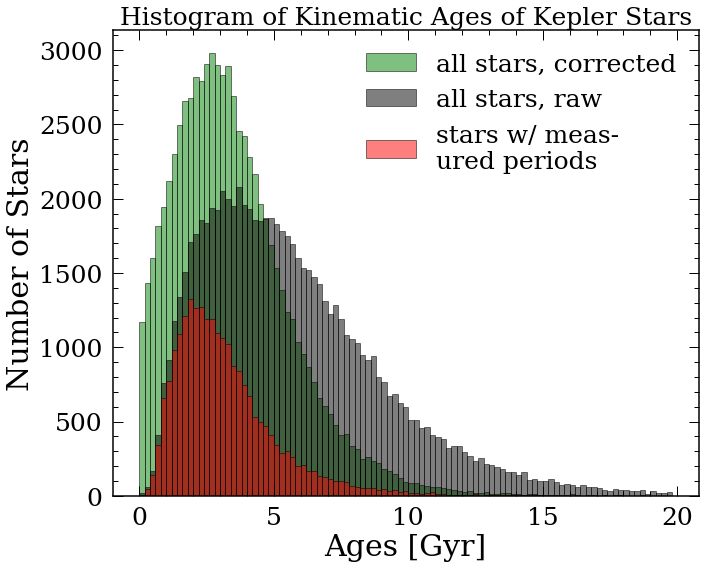

In [35]:
both_df=df_bin_rotrvar.loc[df_bin_rotrvar['KID'].isin(df_bin['KID'])]
"""
plt.figure(figsize=(20,8))
cm = plt.cm.get_cmap('viridis',10)
plt.subplot(1,2,1)
plt.scatter(df_bin_rotrvar['teff_calc'],df_bin_rotrvar['Prot_predict'],
            c=df_bin_rotrvar['kin_age_mix'],s=10,vmin=0,vmax=9,cmap=cm,edgecolors=None)
plt.ylim([1,100])
plt.xlabel('Temperature [K]')
plt.gca().invert_xaxis()
plt.yscale('log')
plt.ylabel('Rotation Period [days]')

cb=plt.colorbar()
cb.set_label('Age [Gyr]')
plt.title('Ages of 77,247 stars in Kepler field',fontsize=25)

plt.subplot(1,2,2)
"""

plt.figure(figsize=(10,8))
bins=[i*(1/5) for i in range(100)]
plt.hist(df_bin_rotrvar['kin_age_correct'],bins=bins,alpha=0.5,color='g',edgecolor='k',label='all stars, corrected')
plt.hist(df_bin_rotrvar['kin_age_mix'],bins=bins,alpha=0.5,color='k',edgecolor='k',label='all stars, raw')
plt.hist(both_df['kin_age_mix'],bins=bins,alpha=0.5,color='r',edgecolor='k',label='stars w/ meas-\nured periods')
print(sum(df_bin_rotrvar['kin_age']>max(bins)))
#plt.yscale('log')
plt.ylabel('Number of Stars')
plt.xlabel('Ages [Gyr]')
plt.title('Histogram of Kinematic Ages of Kepler Stars',fontsize=25)
plt.legend(loc=1)
plt.tight_layout()
print(np.median(df_bin_rotrvar['kin_age_correct']),np.median(both_df['kin_age_mix']))
#plt.plot([3,3],[0,2000])
plt.savefig('Age_recover_ac.png')





75480
405
5.0705633985 2.8039182675000003


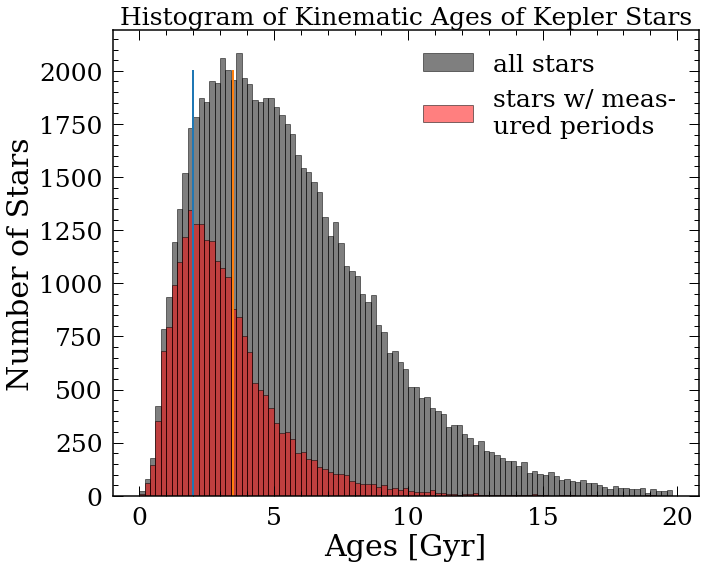

In [73]:
df_bin=pd.read_csv('Gyrokinage2020_Prot.csv',skiprows=1)
df_bin_rotrvar=pd.read_csv('Gyrokinage2020_All.csv',skiprows=1)
print(len(df_bin_rotrvar))
both_df=df_bin_rotrvar.loc[df_bin_rotrvar['kepid'].isin(df_bin['kepid'])]
"""
plt.figure(figsize=(20,8))
cm = plt.cm.get_cmap('viridis',10)
plt.subplot(1,2,1)
plt.scatter(df_bin_rotrvar['teff_calc'],df_bin_rotrvar['Prot_predict'],
            c=df_bin_rotrvar['kin_age_mix'],s=10,vmin=0,vmax=9,cmap=cm,edgecolors=None)
plt.ylim([1,100])
plt.xlabel('Temperature [K]')
plt.gca().invert_xaxis()
plt.yscale('log')
plt.ylabel('Rotation Period [days]')

cb=plt.colorbar()
cb.set_label('Age [Gyr]')
plt.title('Ages of 77,247 stars in Kepler field',fontsize=25)

plt.subplot(1,2,2)
"""
templow=0
temphi=8000

both_df=both_df.reset_index(drop=True)
m=(both_df['teff']>templow)&(both_df['teff']<temphi)
m2=(df_bin_rotrvar['teff']>templow)&(df_bin_rotrvar['teff']<temphi)

plt.figure(figsize=(10,8))
bins=[i*(1/5) for i in range(100)]
plt.hist(df_bin_rotrvar['kin_age'][m2],bins=bins,alpha=0.5,color='k',edgecolor='k',label='all stars')
plt.hist(both_df['kin_age'][m],bins=bins,alpha=0.5,color='r',edgecolor='k',label='stars w/ meas-\nured periods')
print(sum(df_bin_rotrvar['kin_age']>max(bins)))
#plt.yscale('log')
plt.ylabel('Number of Stars')
plt.xlabel('Ages [Gyr]')
plt.title('Histogram of Kinematic Ages of Kepler Stars',fontsize=25)
plt.legend(loc=1)
plt.tight_layout()
plt.plot([2,2],[0,2000])
plt.plot([3.5,3.5],[0,2000])
print(np.median(df_bin_rotrvar['kin_age']),np.median(both_df['kin_age']))
#plt.savefig('Age_recover_ac.png')






In [75]:
df_bin_rotrvar.columns

Index(['kepid', 'Prot_predict', 'source_id', 'ra', 'ra_error', 'dec',
       'dec_error', 'v_b', 'v_b_err', 'vel_dis', 'kin_age', 'kin_age_err_AVR',
       'kin_age_mix_err', 'kin_age_err_t', 'Ro', 'teff', 'abs_G'],
      dtype='object')

0
-0.14 -0.12


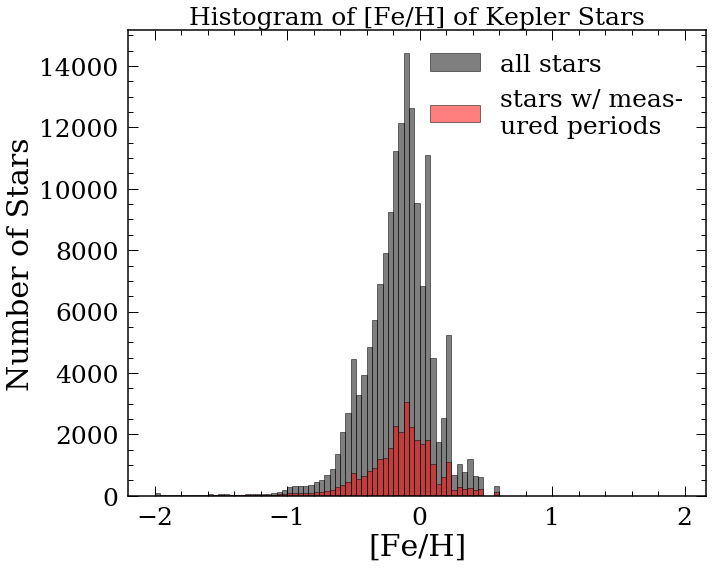

In [36]:
plt.figure(figsize=(10,8))
bins=[i*(1/5)/5 for i in range(-50,50)]
plt.hist(df_bin_rotrvar['feh'],bins=bins,alpha=0.5,color='k',edgecolor='k',label='all stars')
plt.hist(both_df['feh'],bins=bins,alpha=0.5,color='r',edgecolor='k',label='stars w/ meas-\nured periods')
#plt.plot([-0.14,-0.14],[0,14000])
#plt.plot([-0.12,-0.12],[0,14000])
print(sum(df_bin_rotrvar['feh']>max(bins)))
#plt.yscale('log')
plt.ylabel('Number of Stars')
plt.xlabel('[Fe/H]')
plt.title('Histogram of [Fe/H] of Kepler Stars',fontsize=25)
plt.legend(loc=1)
plt.tight_layout()
print(np.median(df_bin_rotrvar['feh']),np.median(both_df['feh']))
plt.savefig('feh.png')


In [37]:
df_bin_rotrvar['Ro']=df_bin_rotrvar['Prot_predict']/stardate.convective_overturn_time(df_bin_rotrvar['mass'])

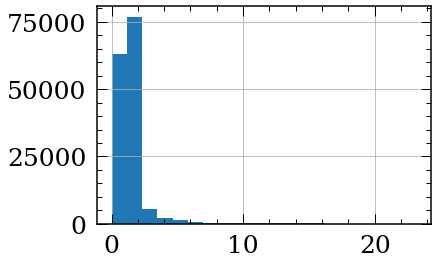

In [38]:
df_bin_rotrvar['Ro'].hist(bins=20)

In [39]:
def calcML(mass):
    return np.power(mass,-2.5)*10

df_bin_rotrvar['ML']=calcML(df_bin_rotrvar['mass'])


154965
(153552, 298)
(153552, 298)
153552
25503


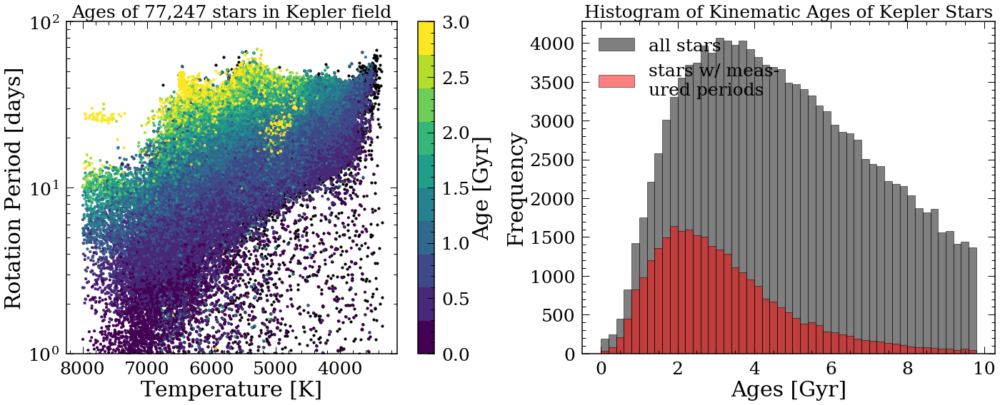

In [40]:
print(len(df_bin_rotrvar))
df_bin_plot_comp=df_bin_rotrvar.loc[df_bin_rotrvar['ML']>1]
#df_bin_plot_comp=df_bin_rotrvar.loc[df_bin_rotrvar['kin_age_mix']>5]
#df_bin_plot_comp=df_bin_plot_comp.loc[df_bin_plot_comp['lum_val']<0.4]
#df_bin_plot_comp=df_bin_plot_comp.loc[df_bin_plot_comp['ML']>30]
#df_bin_plot_comp=df_bin_rotrvar.loc[df_bin_rotrvar['Prot_mix']<70]
print(np.shape(df_bin_plot_comp))
#df_bin_plot_comp=df_bin_plot_comp.loc[df_bin_plot_comp['Ro']<1.5]
print(np.shape(df_bin_plot_comp))
#df_bin_plot_comp=df_bin_plot_comp.loc[df_bin_plot_comp['teff_calc']>4500]
#df_bin_plot_comp=df_bin_plot_comp.loc[df_bin_plot_comp['teff_calc']<5500]
print(len(df_bin_plot_comp))

plt.figure(figsize=(20,8))
cm = plt.cm.get_cmap('viridis',10)
plt.subplot(1,2,1)
plt.scatter(df_bin['teff_calc'],df_bin['Prot'],c='k',s=10,vmin=0,vmax=9,cmap=cm,edgecolors=None)
plt.scatter(df_bin_plot_comp['teff_calc'],df_bin_plot_comp['Prot_mix'],
            c=df_bin_plot_comp['Ro'],s=10,vmin=0,vmax=3,cmap=cm,edgecolors=None)
plt.ylim([1,100])
plt.xlabel('Temperature [K]')
plt.gca().invert_xaxis()
plt.yscale('log')
plt.ylabel('Rotation Period [days]')

cb=plt.colorbar()
cb.set_label('Age [Gyr]')
plt.title('Ages of 77,247 stars in Kepler field',fontsize=25)

both_df=df_bin_plot_comp.loc[df_bin_plot_comp['KID'].isin(df_bin['KID'])]

plt.subplot(1,2,2)
bins=[i*(1/5) for i in range(50)]
plt.hist(df_bin_plot_comp['kin_age_mix'],bins=bins,alpha=0.5,color='k',edgecolor='k',label='all stars')
plt.hist(both_df['kin_age_mix'],bins=bins,alpha=0.5,color='r',edgecolor='k',label='stars w/ meas-\nured periods')
print(sum(df_bin_plot_comp['kin_age']>max(bins)))
#plt.yscale('log')
plt.ylabel('Frequency')
plt.xlabel('Ages [Gyr]')
plt.title('Histogram of Kinematic Ages of Kepler Stars',fontsize=25)
plt.legend(loc=2)
plt.tight_layout()

#plt.savefig('Age_recover_ac.png')





9891 2606


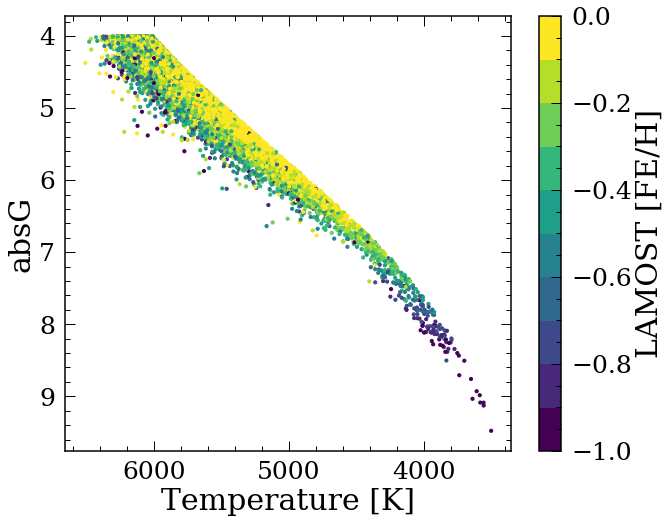

In [55]:
"""
plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
cm = plt.cm.get_cmap('viridis',10)
plt.scatter(df_bin_plot_comp['teff_calc'],df_bin_plot_comp['abs_G'],
            c=df_bin_plot_comp['kin_age_mix'],s=10,vmin=4,vmax=8,cmap=cm,edgecolors=None)
cb=plt.colorbar()
cb.set_label('Age [Gyr]')
#plt.scatter(both_df['teff_calc'],both_df['abs_G'],c='k',s=10,alpha=1)

plt.xlabel('Temperature [K]')
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()
plt.ylabel('absG')
"""
wr=pd.read_csv('Gyrokinage2020_Prot.csv',skiprows=1)

#plt.subplot(1,2,2)
plt.figure(figsize=(10,8))
FEh=pd.read_pickle('../Kepler_LAMOST.pkl')
FEh=FEh.loc[FEh['kin_age']>5]
cm = plt.cm.get_cmap('viridis',10)
plt.scatter(FEh['teff_calc'],FEh['abs_G'],
            c=FEh['[Fe/H]'],s=10,cmap=cm,vmin=-1,vmax=0,edgecolors=None)
cb=plt.colorbar()
cb.set_label('LAMOST [FE/H]')
plt.xlabel('Temperature [K]')
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()
plt.ylabel('absG')


both=pd.merge(wr,FEh[['KIC','[Fe/H]']],left_on='kepid',right_on='KIC',how='inner')
print(len(FEh),len(both))

-0.06286 -0.12742


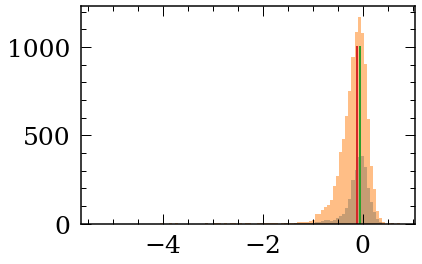

In [64]:
plt.figure()
plt.hist(both[['[Fe/H]']].dropna().values,bins=100,alpha=0.5);
plt.hist(FEh[['[Fe/H]']].dropna().values,bins=100,alpha=0.5);
print(np.median(both[['[Fe/H]']].dropna().values),np.median(FEh[['[Fe/H]']].dropna().values))
plt.plot([-0.06,-0.06],[0,1000])
plt.plot([-0.12,-0.12],[0,1000])

In [110]:
FEh=pd.read_pickle('../Kepler_LAMOST.pkl')
FEh['[Fe/H]']

10       0.01569
12      -0.18120
14       0.02441
15      -0.11293
18      -0.06585
          ...   
56940   -0.00454
56942   -0.10040
56945    0.03802
56952    0.32369
56955   -0.04039
Name: [Fe/H], Length: 12875, dtype: float64

In [114]:
sum(FEh['[Fe/H]']>-0.2)/len(FEh)

0.6338640776699029

In [117]:
checkhe=pd.merge(df_bin[['KIC_x']],FEh[['KID','[Fe/H]']],left_on='KIC_x',right_on='KID',how='inner')

In [121]:
np.mean(checkhe['[Fe/H]'])
print(sum(checkhe['[Fe/H]']>-0.2)/len(checkhe['[Fe/H]']))

0.7523829697098072


In [42]:
columns= [i for i in FEh.columns if ('/Fe]' in i and 'q_' not in i)]
columns

['[C/Fe]',
 '[N/Fe]',
 '[O/Fe]',
 '[Na/Fe]',
 '[Mg/Fe]',
 '[Al/Fe]',
 '[Si/Fe]',
 '[Ca/Fe]',
 '[Ti/Fe]',
 '[Cr/Fe]',
 '[Mn/Fe]',
 '[Co/Fe]',
 '[Ni/Fe]',
 '[Cu/Fe]',
 '[Ba/Fe]']

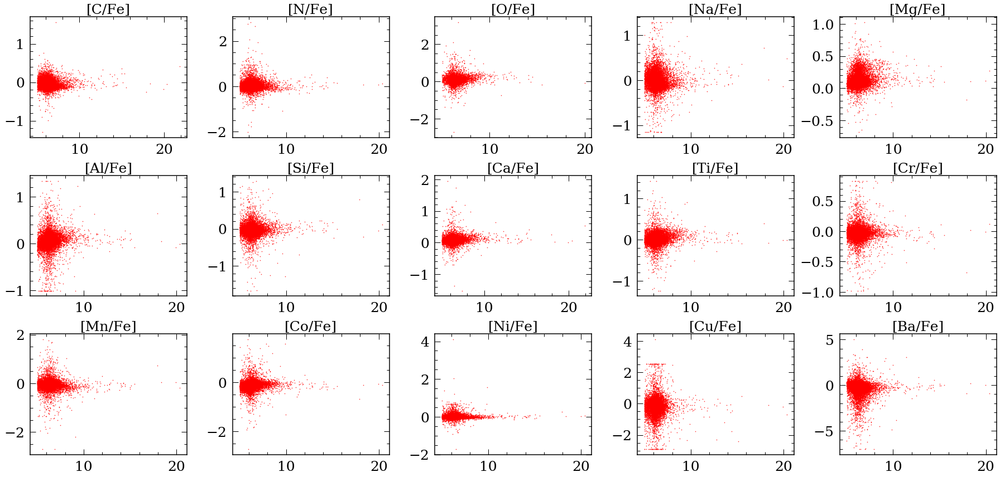

In [43]:
"""
Fe_st=FEh.loc[abs(FEh['[Fe/H]'])<=0.3]
Fe_st=Fe_st.loc[abs(Fe_st['teff_calc']-5778)<=100]
Fe_st=Fe_st.loc[abs(Fe_st['logg']-4.43)<=0.1]
print(len(Fe_st))
"""
plt.figure(figsize=(25,12))
count=1

for i in columns:
    plt.subplot(3,5,count)
    plt.plot(FEh['kin_age'],FEh[i],'r.',alpha=1,markersize=1)
    plt.title(i,fontsize=25)
    #plt.ylim([-0.2,0.3])
    count=count+1
plt.tight_layout()

## Prot comparison

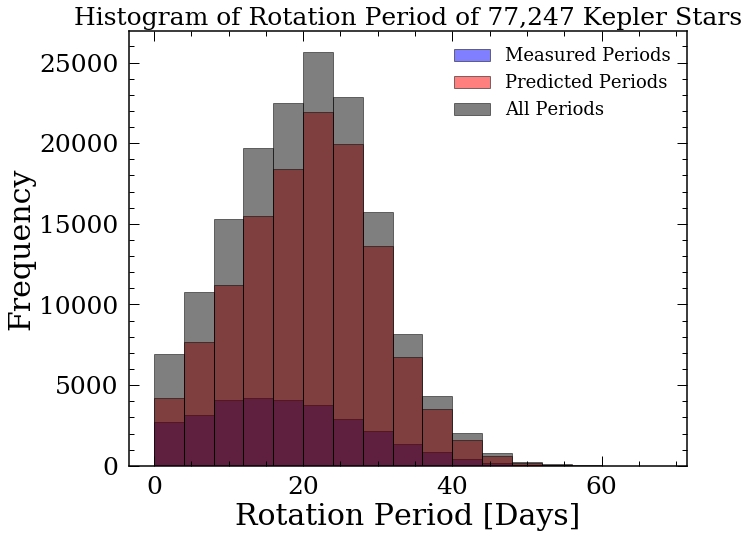

In [44]:
plt.figure(figsize=(10,8))
bins=[i*4 for i in range(18)]
df_bin_rotrvar_wp=df_bin_rotrvar.loc[~df_bin_rotrvar['KID'].isin(df_bin['KID'])]
plt.hist(df_bin['Prot'],bins=bins,alpha=0.5,color='b',edgecolor='k',label='Measured Periods')
plt.hist(df_bin_rotrvar_wp['Prot_predict'],bins=bins,alpha=0.5,color='r',edgecolor='k',
         label='Predicted Periods')
Allperiods=np.append(df_bin_rotrvar.loc[~df_bin_rotrvar['KID'].isin(df_bin['KID'])]['Prot_predict'],
                     df_bin['Prot'])
plt.hist(Allperiods,bins=bins,alpha=0.5,color='k',edgecolor='k',
         label='All Periods')

#plt.yscale('log')
plt.ylabel('Frequency')
plt.xlabel('Rotation Period [Days]')
plt.title('Histogram of Rotation Period of 77,247 Kepler Stars',fontsize=25)
plt.legend(fontsize=18)
plt.savefig('ProtHisto.png')

## Age Comparison

In [45]:
# common ages
df_common=pd.merge(df_bin_rotrvar,df_bin,left_on='KID',right_on='KID',how='inner')
df_common

,solution_id,designation_x,source_id_x,random_index,gaia_ref_epoch_x,ra_x,ra_error_x,dec_x,dec_error_x,parallax_x,...,Ro_new_y,all_vz_new_y,v_t_y,v_b_y,kin_age_err_y,nostars_y,teff_calc_y,vz_err_y,vz_err_all_y,Prot_new
0,1.635721e+18,Gaia DR2 2050233601176543104,2.050234e+18,4.473825e+08,2015.5,291.043057,0.019919,36.593767,0.027553,2.678194,...,0.018258,-3.524411,6.947554,-6.672655,1.480028,2.0,5285.025302,NaN,3.402735,-0.447762
1,1.635721e+18,Gaia DR2 2050232256840088960,2.050232e+18,1.650480e+08,2015.5,291.139702,0.016935,36.622709,0.022043,0.930164,...,0.797637,-11.557931,50.609179,-20.039490,1.534096,2.0,6308.395861,0.790350,0.790350,0.728986
2,1.635721e+18,Gaia DR2 2050232089348169856,2.050232e+18,4.604278e+08,2015.5,291.163281,0.018999,36.627582,0.023907,1.737008,...,0.681972,-4.240750,16.909004,-0.966857,1.057819,59.0,4881.242378,NaN,3.273900,1.139536
3,1.635721e+18,Gaia DR2 2050232639104043904,2.050233e+18,1.244401e+09,2015.5,291.207560,0.019899,36.667624,0.024151,1.895564,...,1.192232,-42.466819,48.426129,-47.684635,1.873166,40.0,4689.994994,NaN,3.357002,1.430803
4,1.635721e+18,Gaia DR2 2050237758705104896,2.050238e+18,9.603271e+08,2015.5,291.264227,0.021547,36.668443,0.025805,1.164493,...,1.262100,3.029837,14.108767,4.320261,1.381350,96.0,5320.302106,NaN,3.305632,1.452141
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29767,NaN,Gaia DR2 2107405113436553856,2.107405e+18,NaN,2015.5,283.626135,0.029896,45.922653,0.031327,0.984285,...,0.015619,-14.065202,30.974415,-5.109533,4.601025,1.0,5268.556846,NaN,5.864866,-0.565274
29768,NaN,Gaia DR2 2107653220809356288,2.107653e+18,NaN,2015.5,283.299669,0.274335,47.574221,0.328845,3.291184,...,1.278638,-11.901649,15.226596,-12.546388,5.115815,1.0,4270.036400,NaN,6.166740,1.465998
29769,NaN,Gaia DR2 2119667691742387456,2.119668e+18,NaN,2015.5,282.330377,0.036173,47.724835,0.040171,5.365343,...,0.011442,2.879721,27.568836,-10.099614,1.585579,1.0,3605.637605,NaN,6.213702,-0.123640
29770,NaN,Gaia DR2 2134995772891301504,2.134996e+18,NaN,2015.5,294.320768,0.021501,49.236401,0.028027,0.618519,...,1.460409,11.853984,59.656784,4.427318,2.358682,1.0,5941.076063,1.385355,1.385355,0.946369


In [46]:
list(df_common.columns)

['solution_id',
 'designation_x',
 'source_id_x',
 'random_index',
 'gaia_ref_epoch_x',
 'ra_x',
 'ra_error_x',
 'dec_x',
 'dec_error_x',
 'parallax_x',
 'parallax_error_x',
 'parallax_over_error_x',
 'pmra_x',
 'pmra_error_x',
 'pmdec_x',
 'pmdec_error_x',
 'ra_dec_corr_x',
 'ra_parallax_corr_x',
 'ra_pmra_corr_x',
 'ra_pmdec_corr_x',
 'dec_parallax_corr_x',
 'dec_pmra_corr_x',
 'dec_pmdec_corr_x',
 'parallax_pmra_corr_x',
 'parallax_pmdec_corr_x',
 'pmra_pmdec_corr_x',
 'astrometric_n_obs_al',
 'astrometric_n_obs_ac',
 'astrometric_n_good_obs_al',
 'astrometric_n_bad_obs_al',
 'astrometric_gof_al',
 'astrometric_chi2_al_x',
 'astrometric_excess_noise_x',
 'astrometric_excess_noise_sig_x',
 'astrometric_params_solved',
 'astrometric_primary_flag_x',
 'astrometric_weight_al',
 'astrometric_pseudo_colour',
 'astrometric_pseudo_colour_error',
 'mean_varpi_factor_al',
 'astrometric_matched_observations',
 'visibility_periods_used',
 'astrometric_sigma5d_max',
 'frame_rotator_object_type',

KeyError: 'teff_calc'

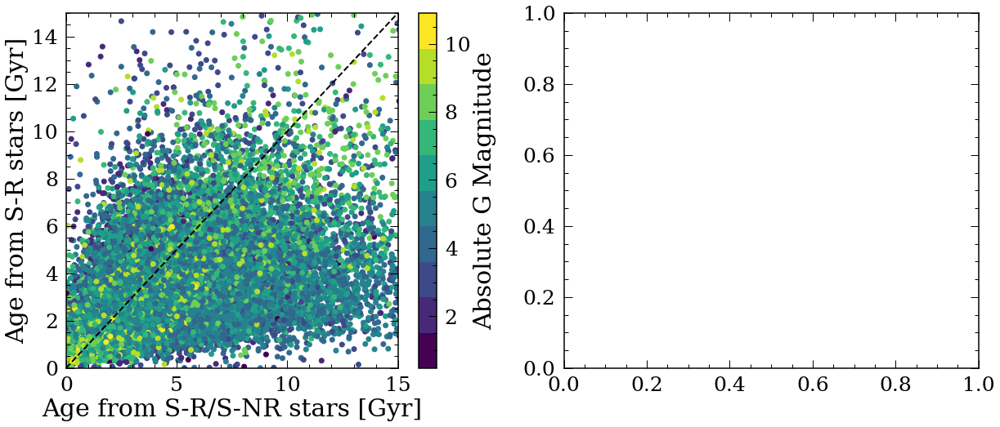

In [47]:
plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
cm = plt.cm.get_cmap('viridis',10)
"""
plt.errorbar(df_common['kin_age_x'],df_common['kin_age_y'],xerr=df_common['kin_age_err_bs_x'],
             yerr=df_common['kin_age_err_bs_y'],fmt='k.',alpha=0.04,markersize=1)
"""
plt.scatter(df_common['kin_age_x'],df_common['kin_age_y'],c=df_common['abs_G_x'],cmap=cm,edgecolors=None)
plt.plot([0,15],[0,15],'k--',linewidth=2)
#plt.yscale('log')
#plt.xscale('log')
cb=plt.colorbar()
cb.set_label('Absolute G Magnitude')
plt.xlim([0,15])
plt.ylim([0,15])
plt.xlabel('Age from S-R/S-NR stars [Gyr]')
plt.ylabel('Age from S-R stars [Gyr]')

plt.subplot(1,2,2)
df_common['diffs']=abs(df_common['kin_age_x']-df_common['kin_age_y'])
cm = plt.cm.get_cmap('viridis',10)
plt.scatter(df_common['teff_calc'],df_common['abs_G_x'],c=df_common['diffs'],cmap=cm,edgecolors=None,
           vmin=0,vmax=5)
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()
cb=plt.colorbar()
cb.set_label('Absolute difference in Age [Gyr]')
plt.xlabel('Temperature [K]')
plt.ylabel('Absolute G Magnitude')

df_common.to_pickle('comp.pkl')

plt.savefig('AgeCompare_noerr.png')

In [49]:
plt.figure(figsize=(10,8))
df_common['diffs']=abs(df_common['kin_age_x']-df_common['kin_age_y'])
cm = plt.cm.get_cmap('viridis',10)
plt.scatter(df_common['teff_calc'],df_common['Prot'],c=df_common['diffs'],cmap=cm,edgecolors=None,
           vmin=0,vmax=5)
plt.gca().invert_xaxis()
plt.yscale('log')
#plt.gca().invert_yaxis()
cb=plt.colorbar()
cb.set_label('Absolute difference in Age [Gyr]')
plt.ylabel('Rotaton Period [Days]')
plt.xlabel('Temperature [K]')
plt.savefig('Diff.png')

sum(df_common['kin_age_x']-df_common['kin_age_y']<0)

KeyError: 'teff_calc'

<Figure size 720x576 with 0 Axes>

KeyError: 'Prot'

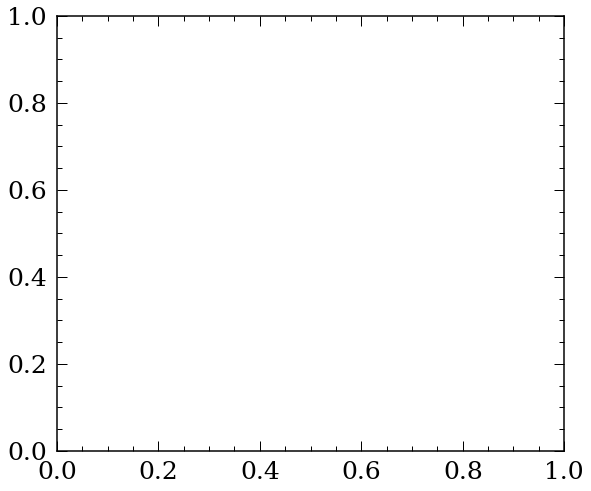

In [50]:
plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
cm = plt.cm.get_cmap('viridis',10)
"""
plt.errorbar(df_common['kin_age_x'],df_common['kin_age_y'],xerr=df_common['kin_age_err_bs_x'],
             yerr=df_common['kin_age_err_bs_y'],fmt='k.',alpha=0.04,markersize=1)
"""
plt.scatter(df_common['kin_age_x'],df_common['kin_age_y'],c=df_common['Prot'],cmap=cm,edgecolors=None)
plt.plot([0,15],[0,15],'k--',linewidth=2)
#plt.yscale('log')
#plt.xscale('log')
cb=plt.colorbar()
cb.set_label('Measured Rotation Period [Days]')
plt.xlim([0,15])
plt.ylim([0,15])
plt.xlabel('Age from predicted periods [Gyr]')
plt.ylabel('Age from measured periods [Gyr]')

plt.subplot(1,2,2)
plt.errorbar(df_common['kin_age_x'],df_common['kin_age_y'],
             xerr=df_common['kin_age_err_bs_x'],yerr=df_common['kin_age_err_bs_y'],fmt='r.',alpha=0.2)
plt.plot([0,15],[0,15],'k--',linewidth=2)
#plt.yscale('log')
#plt.xscale('log')
plt.xlim([0,15])
plt.ylim([0,15])
plt.xlabel('Age from predicted periods [Gyr]')
plt.ylabel('Age from measured periods [Gyr]')
plt.tight_layout()

plt.savefig('AgeCompare.png')

## For Rvar

Stars with z>0.27 kpc: 0.23799099109424965


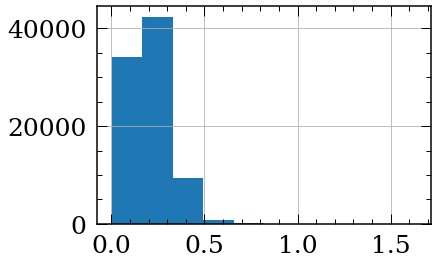

In [51]:
fname_bin='minchisq_rvar.pkl'

df_bin_rvar=pd.read_pickle('../'+fname_bin)
df_bin_rvar=df_bin_rvar.dropna(subset=['kin_age','iso_age'])
df_bin_rvar.z.hist()
print('Stars with z>0.27 kpc:',sum(df_bin_rvar.z>0.270)/len(df_bin_rvar))
df_bin_rvar=df_bin_rvar.loc[df_bin_rvar['z']<=0.27]

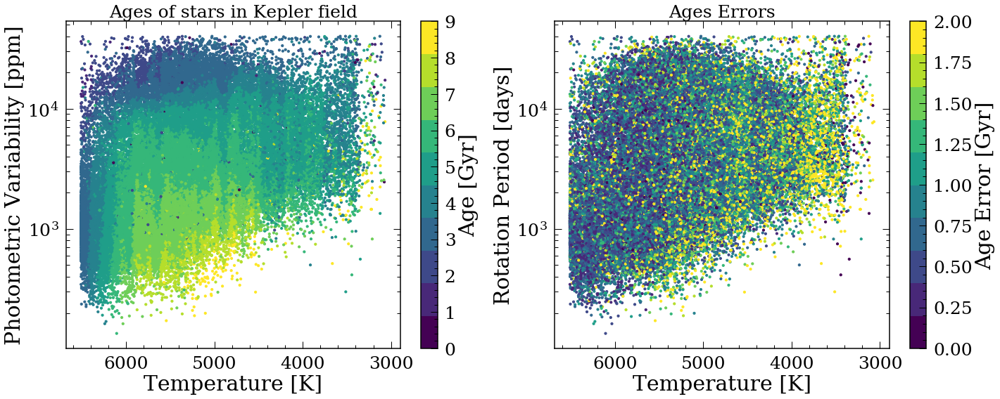

In [52]:
plt.figure(figsize=(20,8))
cm = plt.cm.get_cmap('viridis',10)
plt.subplot(1,2,1)
plt.scatter(df_bin_rvar['teff_calc'],df_bin_rvar['Rvar'],c=df_bin_rvar['kin_age'],s=10,vmin=0,vmax=9,cmap=cm,edgecolors=None)

plt.xlabel('Temperature [K]')
plt.gca().invert_xaxis()
plt.yscale('log')
plt.ylabel('Photometric Variability [ppm]')

cb=plt.colorbar()
cb.set_label('Age [Gyr]')
plt.title('Ages of stars in Kepler field',fontsize=25)

plt.subplot(1,2,2)
plt.scatter(df_bin_rvar['teff_calc'],df_bin_rvar['Rvar'],c=df_bin_rvar['kin_age_err'],s=10,vmin=0,vmax=2,cmap=cm,edgecolors=None)

plt.xlabel('Temperature [K]')
plt.gca().invert_xaxis()
plt.yscale('log')
plt.ylabel('Rotation Period [days]')

cb=plt.colorbar()
cb.set_label('Age Error [Gyr]')
plt.title('Ages Errors',fontsize=25)
plt.tight_layout()

plt.savefig('Age_recover_rvar.png')



# Compare to isochrone ages


## For Prot

binned in [log(Prot),teff,abs_G]=[0.5,350,0.17]

KeyError: 'kin_age_err_bs'

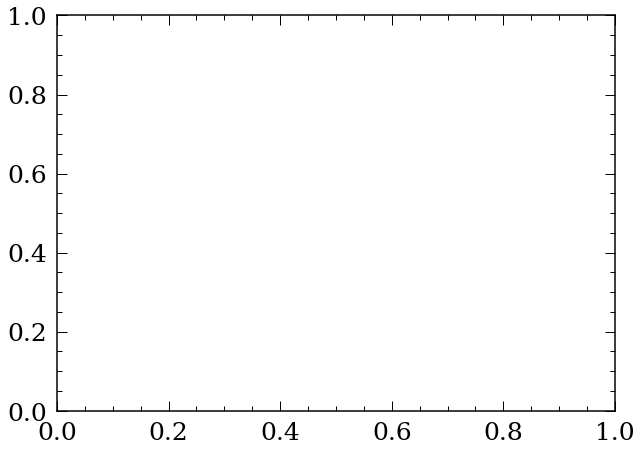

In [53]:
XD=np.load('../XD_Prot.npy')
df_bin['iso_age_err']=np.sqrt(df_bin['iso_age_err1']**2+df_bin['iso_age_err2']**2)

df_bin_plot=df_bin.loc[df_bin['iso_age']<10]
df_bin_plot=df_bin_plot.loc[df_bin_plot['iso_age_err1']<3]

plt.figure(figsize=(10,16))
plt.subplot(2,1,1)
plt.errorbar(df_bin_plot['kin_age'], df_bin_plot['iso_age'],
             yerr=df_bin_plot['iso_age_err1'],xerr=df_bin_plot['kin_age_err_bs'],
             fmt='ro',alpha=0.1,markersize=1)
plt.plot(df_bin_plot['kin_age'], df_bin_plot['iso_age'],'ko',alpha=1,markersize=2)

plt.plot([0,10],[0,10],'k--')
plt.xlim([0,10])
plt.ylim([0,10])
plt.xlabel('Gyro-Kinematic Age [Gyr]')
plt.ylabel('Isochrone Age [Gyr]')
plt.title('Individual Ages, $\chi^2$=1.3',fontsize=25)

plt.subplot(2,1,2)

plt.errorbar(df_bin_plot['kin_age'], df_bin_plot['iso_age_ave'],
             yerr=df_bin_plot['iso_age_err1'],xerr=df_bin_plot['kin_age_err_bs'],
             fmt='ro',alpha=0.01,markersize=1)
plt.plot(df_bin_plot['kin_age'], df_bin_plot['iso_age_ave'],'ko',alpha=0.2,markersize=2)
plt.plot(XD[:, 1], XD[:, 0], 'b.',markersize=7,label='After extreme-deconvolution')

plt.plot([0,10],[0,10],'k--')
plt.xlim([0,10])
plt.ylim([0,10])
plt.xlabel('Gyro-Kinematic Age [Gyr]')
plt.ylabel('Isochrone Age [Gyr]')
plt.title('Average Ages',fontsize=25)
plt.tight_layout()

plt.savefig('Iso_kin_ages.png')

from scipy import stats
print(stats.pearsonr(XD[:, 0], XD[:, 1]))


print(len(df_bin_plot))

## For Rvar

binned in [log(Rvar),teff,abs_G]=[1.5,100,0.1]

Higher Rvar -> older star.
Since Rvar can only be a lower limit (inclination makes Rvar decrease) so the age will be an upper limit.


In [ ]:
XD_rvar=np.load('../XD_Rvar.npy')

df_bin_rvar['iso_age_err']=np.sqrt(df_bin_rvar['iso_age_err1']**2+df_bin_rvar['iso_age_err2']**2)

df_bin_plot_rvar=df_bin_rvar.loc[df_bin_rvar['iso_age']<10]
df_bin_plot_rvar=df_bin_plot_rvar.loc[df_bin_plot_rvar['iso_age_err1']<3]

plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
plt.errorbar(df_bin_plot_rvar['kin_age'], df_bin_plot_rvar['iso_age'],
             yerr=df_bin_plot_rvar['iso_age_err1'],xerr=df_bin_plot_rvar['kin_age_err'],
             fmt='ro',alpha=0.1,markersize=1)
plt.plot(df_bin_plot_rvar['kin_age'], df_bin_plot_rvar['iso_age'],'ko',alpha=1,markersize=2)

plt.plot([0,10],[0,10],'k--')
plt.xlim([0,10])
plt.ylim([0,10])
plt.xlabel('Kin. Ages')
plt.ylabel('iso. Ages')
plt.title('Individual Ages',fontsize=25)

plt.subplot(1,2,2)
plt.errorbar(df_bin_plot_rvar['kin_age'], df_bin_plot_rvar['iso_age_ave'],
             yerr=df_bin_plot_rvar['iso_age_err1'],xerr=df_bin_plot_rvar['kin_age_err'],
             fmt='ro',alpha=0.01,markersize=1)
plt.plot(df_bin_plot_rvar['kin_age'], df_bin_plot_rvar['iso_age_ave'],'ko',alpha=0.2,markersize=2)

plt.plot(XD_rvar[:, 1], XD_rvar[:, 0], 'b.',markersize=7,label='After extreme-deconvolution')

plt.plot([0,10],[0,10],'k--')
plt.xlim([0,10])
plt.ylim([0,10])
plt.xlabel('Kin. Ages')
plt.ylabel('iso. Ages')
plt.title('Average Ages',fontsize=25)
plt.savefig('Iso_kin_ages_rvar.png')



In [ ]:
print(len(df_bin_plot_rvar))
plt.figure(figsize=(10,8))
plt.errorbar(df_bin_plot_rvar['kin_age'], df_bin_plot_rvar['iso_age_ave'],
             yerr=df_bin_plot_rvar['iso_age_err1'],xerr=df_bin_plot_rvar['kin_age_err'],
             fmt='ro',alpha=0.01,markersize=1)
plt.plot(df_bin_plot_rvar['kin_age'], df_bin_plot_rvar['iso_age_ave'],'ko',alpha=0.2,markersize=2)

plt.plot(XD_rvar[:, 1], XD_rvar[:, 0], 'b.',markersize=7,label='After extreme-deconvolution')

plt.plot([0,10],[0,10],'k--')
plt.xlim([0,10])
plt.ylim([0,10])
plt.xlabel('Gyro-Kinematic Age [Gyr]')
plt.ylabel('Isochrone Age [Gyr]')
plt.title('Average Ages',fontsize=25)
plt.savefig('Iso_kin_ages_rvar.png')

# Age distributions

16
0


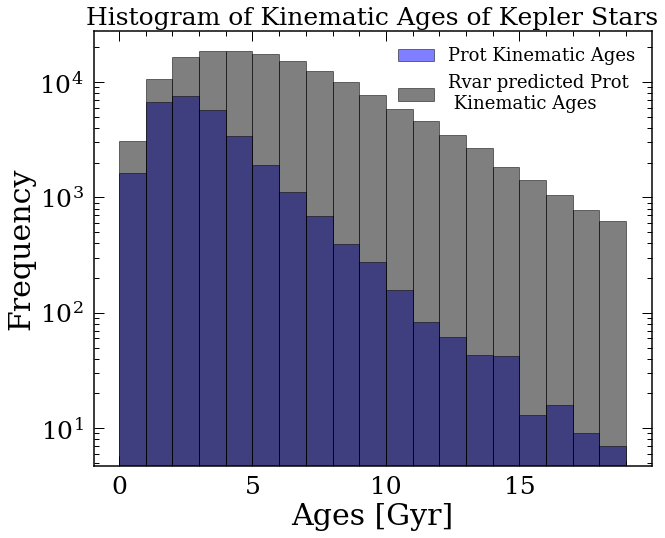

In [54]:
df_bin=df_bin.loc[df_bin['kin_age']<20]
df_bin_rvar=df_bin_rvar.loc[df_bin_rvar['kin_age']<20]
df_bin_rotrvar=df_bin_rotrvar.loc[df_bin_rotrvar['kin_age']<20]

plt.figure(figsize=(10,8))
bins=[i for i in range(20)]
plt.hist(df_bin['kin_age'],bins=bins,alpha=0.5,color='b',edgecolor='k',label='Prot Kinematic Ages')
#plt.hist(df_bin_rvar['kin_age'],bins=bins,alpha=0.5,color='r',edgecolor='k',label='Rvar Kinematic Ages')
plt.hist(df_bin_rotrvar['kin_age'],bins=bins,alpha=0.5,color='k',edgecolor='k',
         label='Rvar predicted Prot\n Kinematic Ages')
print(sum(df_bin['kin_age']>max(bins)))
print(sum(df_bin_rvar['kin_age']>max(bins)))
plt.yscale('log')
plt.ylabel('Frequency')
plt.xlabel('Ages [Gyr]')
plt.title('Histogram of Kinematic Ages of Kepler Stars',fontsize=25)
plt.legend(fontsize=18)
plt.savefig('AgesHisto.png')

all periods: 29915
29915
569
66
all periods: 29915
29915
569
66


(0, 10)

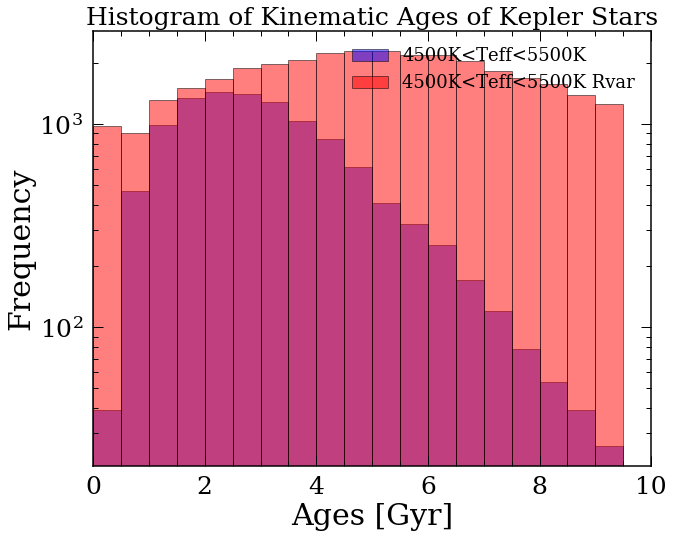

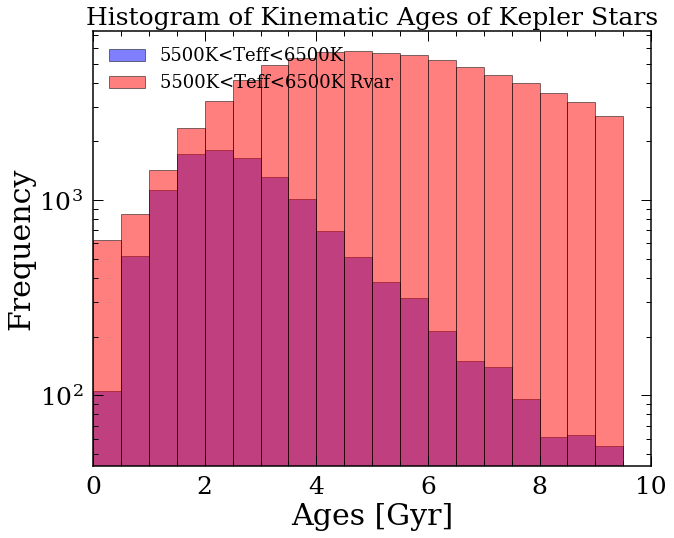

In [55]:
df_rvar_prot=pd.read_pickle('../KinageAllKepler.pkl')

print('all periods:',len(df_bin))
df_bincoll=df_bin.loc[df_bin['Prot']<70]
print(len(df_bincoll))
df_bincoll=df_bincoll.loc[df_bincoll['teff_calc']>4500]
df_bincoll=df_bincoll.loc[df_bincoll['teff_calc']<5500]

df_rvar_prot_plot=df_rvar_prot.loc[df_rvar_prot['Prot_predict']<70]
df_rvar_prot_plot=df_rvar_prot_plot.loc[df_rvar_prot_plot['teff_calc']>4500]
df_rvar_prot_plot=df_rvar_prot_plot.loc[df_rvar_prot_plot['teff_calc']<5500]

plt.figure(figsize=(10,8))
bins=[i*0.5 for i in range(20)]
plt.hist(df_bincoll['kin_age'],bins=bins,alpha=0.5,color='b',edgecolor='k',label='4500K<Teff<5500K')
plt.hist(df_rvar_prot_plot['kin_age'],bins=bins,alpha=0.5,color='r',edgecolor='k',label='4500K<Teff<5500K Rvar')
print(sum(df_bin['kin_age']>max(bins)))
print(sum(df_bin_rvar['kin_age']>max(bins)))
plt.yscale('log')
plt.ylabel('Frequency')
plt.xlabel('Ages [Gyr]')
plt.title('Histogram of Kinematic Ages of Kepler Stars',fontsize=25)
plt.legend(fontsize=18)
plt.xlim([0,10])

print('all periods:',len(df_bin))
df_bincoll=df_bin.loc[df_bin['Prot']<70]
print(len(df_bincoll))
df_bincoll=df_bincoll.loc[df_bincoll['teff_calc']>5500]
df_bincoll=df_bincoll.loc[df_bincoll['teff_calc']<6500]

df_rvar_prot_plot=df_rvar_prot.loc[df_rvar_prot['Prot_predict']<70]
df_rvar_prot_plot=df_rvar_prot_plot.loc[df_rvar_prot_plot['teff_calc']>5500]
df_rvar_prot_plot=df_rvar_prot_plot.loc[df_rvar_prot_plot['teff_calc']<6500]

plt.figure(figsize=(10,8))
bins=[i*0.5 for i in range(20)]
plt.hist(df_bincoll['kin_age'],bins=bins,alpha=0.5,color='b',edgecolor='k',label='5500K<Teff<6500K')
plt.hist(df_rvar_prot_plot['kin_age'],bins=bins,alpha=0.5,color='r',edgecolor='k',label='5500K<Teff<6500K Rvar')
print(sum(df_bin['kin_age']>max(bins)))
print(sum(df_bin_rvar['kin_age']>max(bins)))
plt.yscale('log')
plt.ylabel('Frequency')
plt.xlabel('Ages [Gyr]')
plt.title('Histogram of Kinematic Ages of Kepler Stars',fontsize=25)
plt.legend(fontsize=18)
plt.xlim([0,10])
#plt.savefig('AgesHisto.png')

# Compare to AS stars

Stars from https://arxiv.org/pdf/1601.02631.pdf (AMP ages) and \< AS paper in Travis' paper \>

## For Prot

In [56]:
ASstars=pd.read_table('/Users/lucy/Desktop/KeplerAges/ASage.webarchive',delimiter=',',skiprows=2)
ASstars=ASstars.dropna(subset=['KIC'])

seismicKID=[12069424,12069449,3427720,3656476,5184732,6116048,6196457,6521045,7680114,7871531,8006161,8349582,
           9098294,9139151,9955598,10454113,10586004,10644253,10963065,11244118,11401755]

seismicAge=[7.07,6.82,2.23,8.13,4.17,6.23,5.51,6.24,7.19,9.15,5.04,7.93,7.28,1.71,6.43,2.03,6.35,
            1.07,4.36,6.43,5.85]
seismicAge_err=[0.46,0.28,0.17,0.59,0.40,0.37,0.71,0.37,0.70,0.47,0.17,0.94,0.51,0.19,0.47,0.29,
                1.37,0.25,0.46,0.58,0.93]

for i in ASstars['KIC'].unique():
    AS_single=ASstars.loc[ASstars['KIC']==i]
    seismicKID.append(int(i))
    seismicAge.append(np.mean(AS_single['Age']))
    seismicAge_err.append((max(AS_single['Age'])-min(AS_single['Age']))/2.)

    
All_ASstars=pd.DataFrame(np.array((seismicKID,seismicAge,seismicAge_err)).T,
                         columns=['KID','ASAge','ASAge_err'])

Clusters_cm=pd.merge(All_ASstars,df_bin,left_on='KID',right_on='KID',how='inner')
Clusters_cm




,KID,ASAge,ASAge_err,KIC_x,iso_mass,iso_mass_err1,iso_mass_err2,iso_teff,iso_teff_err1,iso_teff_err2,...,all_vz_new,v_t,v_b,kin_age_err,nostars,teff_calc,vz_err,vz_err_all,Prot_new,iso_age_err
0,7871531.0,9.150000,0.47000,7871531,0.815,0.039,-0.028,5386.2,86.4,-78.4,...,7.568665,11.463795,6.599959,1.693053,8.0,5391.392723,0.269193,0.269193,1.547732,4.149458
1,7871531.0,9.360683,0.63170,7871531,0.815,0.039,-0.028,5386.2,86.4,-78.4,...,7.568665,11.463795,6.599959,1.693053,8.0,5391.392723,0.269193,0.269193,1.547732,4.149458
2,9098294.0,7.280000,0.51000,9098294,0.972,0.071,-0.067,5905.7,113.3,-109.6,...,10.157649,40.684501,10.957324,1.124449,35.0,5878.472371,2.648470,2.648470,1.303453,3.948721
3,9098294.0,8.001783,0.54015,9098294,0.972,0.071,-0.067,5905.7,113.3,-109.6,...,10.157649,40.684501,10.957324,1.124449,35.0,5878.472371,2.648470,2.648470,1.303453,3.948721
4,7103006.0,2.051950,0.55215,7103006,1.403,0.067,-0.065,6371.9,124.9,-123.9,...,4.010825,13.386768,2.175452,1.719028,9.0,6318.137126,0.123105,0.123105,0.670012,0.595483
5,7206837.0,2.341300,0.79485,7206837,1.325,0.054,-0.057,6275.5,142.7,-110.9,...,-6.237502,17.305248,-12.178198,1.004541,13.0,6280.210709,1.165752,1.165752,0.610504,0.828070
6,7771282.0,3.191900,0.55845,7771282,1.340,0.066,-0.055,6503.9,162.3,-176.6,...,-10.977107,31.053365,-19.112446,1.231860,19.0,6333.659973,0.213093,0.213093,1.056156,0.771557
7,8379927.0,1.749933,0.18065,8379927,1.127,0.069,-0.087,5990.7,115.3,-106.5,...,-12.625129,23.291113,-20.112962,1.356166,21.0,5986.682432,0.257395,0.257395,1.237683,2.598865
8,10079226.0,2.799083,0.23455,10079226,1.105,0.065,-0.071,5955.4,107.1,-105.8,...,-13.711279,32.837817,-13.589580,1.393710,27.0,5938.529888,0.073764,0.073764,1.196824,2.982968
9,10162436.0,2.580350,0.56805,10162436,1.274,0.121,-0.068,6237.9,125.3,-117.7,...,-20.277372,21.259679,-19.457430,2.468204,11.0,6202.431492,0.090370,0.090370,1.116925,1.167647


In [57]:
All_ASstars

,KID,ASAge,ASAge_err
0,12069424.0,7.070000,0.46000
1,12069449.0,6.820000,0.28000
2,3427720.0,2.230000,0.17000
3,3656476.0,8.130000,0.59000
4,5184732.0,4.170000,0.40000
...,...,...,...
82,12069127.0,1.848333,0.12575
83,12069424.0,6.973883,0.42960
84,12069449.0,7.088967,0.23710
85,12258514.0,4.514033,0.86915


KeyError: 'kin_age_err_bs'

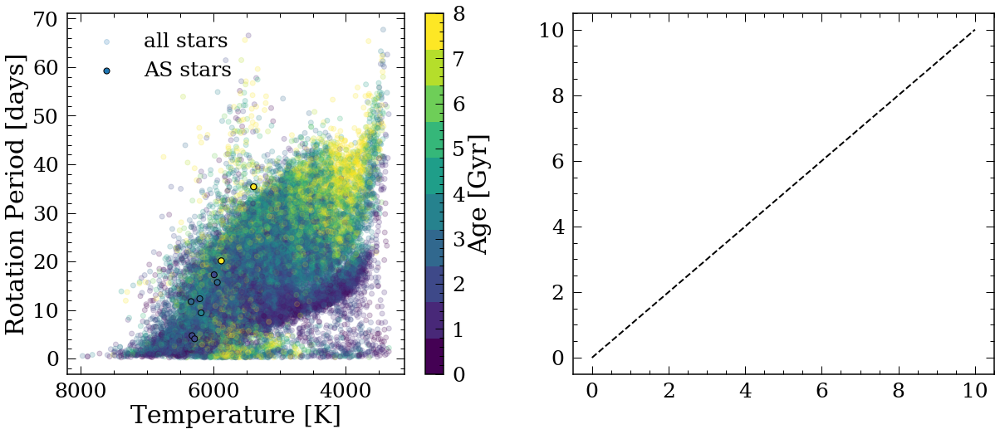

In [58]:
plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
cm = plt.cm.get_cmap('viridis',10)
plt.scatter(df_bin['teff_calc'],df_bin['Prot'],
            c=df_bin['kin_age'],cmap=cm,vmin=0,vmax=8,alpha=0.2,label='all stars')
plt.scatter(Clusters_cm['teff_calc'],Clusters_cm['Prot'],
            c=Clusters_cm['ASAge'],cmap=cm,vmin=0,vmax=8,edgecolor='k',s=50,label='AS stars')
cb=plt.colorbar()
plt.legend()

cb.set_label('Age [Gyr]')
plt.gca().invert_xaxis()
plt.xlabel('Temperature [K]')
plt.ylabel('Rotation Period [days]')



plt.subplot(1,2,2)
plt.plot([0,10],[0,10],'k--')
plt.errorbar(Clusters_cm['kin_age'],Clusters_cm['ASAge'],xerr=Clusters_cm['kin_age_err_bs'],
             yerr=Clusters_cm['ASAge_err'],fmt='ro')
    
plt.ylabel('Astroseismic Ages [Gyr]')
plt.xlabel('Kinematic Ages [Gyr]')
plt.xlim([0,10])
plt.ylim([0,10])
plt.tight_layout()

plt.savefig('ASstars.png')

## Ages for stars with predicted Prot

In [ ]:
Clusters_cm_rotrvar=pd.merge(All_ASstars,df_bin_rotrvar,left_on='KID',right_on='KID',how='inner')
Clusters_cm_rotrvar




In [ ]:
plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
cm = plt.cm.get_cmap('viridis',15)
plt.scatter(df_bin_rotrvar['teff_calc'],df_bin_rotrvar['Prot_mix'],
            c=df_bin_rotrvar['kin_age_mix'],cmap=cm,vmin=0,vmax=8,alpha=0.2,label='all stars')
plt.scatter(Clusters_cm_rotrvar['teff_calc'],Clusters_cm_rotrvar['Prot_mix'],
            c=Clusters_cm_rotrvar['ASAge'],cmap=cm,vmin=0,vmax=8,edgecolor='k',label='AS stars')
cb=plt.colorbar()
plt.legend()

cb.set_label('Age [Gyr]')
plt.gca().invert_xaxis()
plt.yscale('log')
plt.xlabel('Temperature [K]')
plt.ylabel('Rotation Period [Days]')

print(len(Clusters_cm_rotrvar))

plt.subplot(1,2,2)
plt.plot([0,15],[0,15],'k--')
r = np.corrcoef(Clusters_cm_rotrvar["ASAge"], Clusters_cm_rotrvar["kin_age_mix"])
print(r)
plt.errorbar(Clusters_cm_rotrvar['kin_age_mix'],Clusters_cm_rotrvar['ASAge'],
             xerr=Clusters_cm_rotrvar['kin_age_mix_err'],
             yerr=Clusters_cm_rotrvar['ASAge_err'],fmt='ro',label='PC=0.59')

plt.ylabel('Astroseismic Age [Gyr]')
plt.xlabel('Gyro-Kinematic Age [Gyr]')
plt.xlim([0,15])
plt.ylim([0,15])
plt.legend()
plt.tight_layout()

plt.savefig('ASstars_rotrvar.png')

In [ ]:
plt.figure(figsize=(10,8))
plt.plot([0,15],[0,15],'k--')
r = np.corrcoef(Clusters_cm_rotrvar["ASAge"], Clusters_cm_rotrvar["kin_age_mix"])
print(r)
plt.errorbar(Clusters_cm_rotrvar['kin_age_mix'],Clusters_cm_rotrvar['ASAge'],
             xerr=Clusters_cm_rotrvar['kin_age_mix_err'],
             yerr=Clusters_cm_rotrvar['ASAge_err'],fmt='ro',label='PC=0.59')

plt.ylabel('Astroseismic Age [Gyr]')
plt.xlabel('Gyro-Kinematic Age [Gyr]')
plt.xlim([0,15])
plt.ylim([0,15])
plt.legend()
plt.tight_layout()

plt.savefig('ASstars_rotrvar.png')

## For Rvar

In [ ]:
Clusters_cm_rvar=pd.merge(All_ASstars,df_bin_rvar,left_on='KID',right_on='KID',how='inner')
Clusters_cm_rvar



In [ ]:
plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
cm = plt.cm.get_cmap('viridis',15)
plt.scatter(df_bin_rvar['teff_calc'],df_bin_rvar['Rvar'],
            c=df_bin_rvar['kin_age'],cmap=cm,vmin=0,vmax=8,alpha=0.2,label='all stars')
plt.scatter(Clusters_cm_rvar['teff_calc'],Clusters_cm_rvar['Rvar'],
            c=Clusters_cm_rvar['ASAge'],cmap=cm,vmin=0,vmax=8,edgecolor='k',label='AS stars')
cb=plt.colorbar()
plt.legend()

cb.set_label('Age [Gyr]')
plt.gca().invert_xaxis()
plt.yscale('log')
plt.xlabel('Temperature [K]')
plt.ylabel('Rvar')



plt.subplot(1,2,2)
plt.plot([0,15],[0,15],'k--')
plt.errorbar(Clusters_cm_rvar['kin_age'],Clusters_cm_rvar['ASAge'],xerr=Clusters_cm_rvar['kin_age_err_bs'],
             yerr=Clusters_cm_rvar['ASAge_err'],fmt='ro')

plt.ylabel('Astroseismic Ages [Gyr]')
plt.xlabel('Kinematic Ages [Gyr]')
r = np.corrcoef(plotCM["Age"], plotCM["kin_age"])
plt.xlim([0,15])
plt.ylim([0,15])
plt.tight_layout()

plt.savefig('ASstars_rvar.png')

# Individual abundances for solar twins
Magan Bedell abundances: https://ui.adsabs.harvard.edu/abs/2018ApJ...865...68B/abstract
Fe/H and ages: https://ui.adsabs.harvard.edu/abs/2018MNRAS.474.2580S/abstract

## For Prot

In [51]:
df_bin=pd.read_pickle('../df_ruth.pkl')

In [52]:
APOGEE=pd.read_pickle('/Users/lucy/Desktop/ASTR/Columbia/GalacticArch/APOGEE.pkl')

df_st=pd.merge(APOGEE,df_bin,left_on='GAIA_SOURCE_ID',right_on='source_id',how='inner')

In [53]:
sum(df_st.loc[df_st['FE_H']>-5]['FE_H']>-0.2)/len(df_st.loc[df_st['FE_H']>-5])

0.8925831202046036

In [54]:
APOGEE=pd.read_pickle('/Users/lucy/Desktop/ASTR/Columbia/GalacticArch/APOGEE.pkl')

df_st=pd.merge(APOGEE,df_bin,left_on='GAIA_SOURCE_ID',right_on='source_id',how='inner')

df_st=df_st.loc[abs(df_st['FE_H'])<=0.3]
df_st=df_st.loc[abs(df_st['color_teffs']-5778)<=100]
df_st=df_st.loc[abs(df_st['LOGG']-4.43)<=0.1]
print(len(df_st))
df_ka=pd.read_table('../BedellAbund.csv',delimiter=',')
df_ka.HIP=[int(i) for i in df_ka.HIP.values]
df_ka_age=pd.read_table('../Bedell_age.csv',delimiter=',')
df_ka_age.HIP=[int(i) for i in df_ka_age.HIP.values]
df_fe=pd.read_table('../Bedell_Fe.csv',delimiter=',')
df_fe.HIP=[int(i) for i in df_fe.HIP.values]

12


In [55]:
df_st_md=pd.merge(df_ka,df_ka_age,left_on='HIP',right_on='HIP',how='inner')
df_st_md=pd.merge(df_st_md,df_fe,left_on='HIP',right_on='HIP',how='inner')
df_st_md.columns

Index(['HIP', '[CI/H]', '[CH/H]', '[OI/H]', '[NaI/H]', '[MgI/H]', '[AlI/H]',
       '[SiI/H]', '[SI/H]', '[CaI/H]', '[ScI/H]', '[ScII/H]', '[TiI/H]',
       '[TiII/H]', '[VI/H]', '[CrI/H]', '[CrII/H]', '[MnI/H]', '[CoI/H]',
       '[NiI/H]', '[CuI/H]', '[ZnI/H]', '_RA', '_DE', 'recno', 'e_[ZnI/H]',
       'e_[VI/H]', 'e_[TiII/H]', 'e_[SiI/H]', 'e_[TiI/H]', 'e_[SI/H]',
       'e_[ScII/H]', 'e_[ScI/H]', 'e_[OI/H]', 'e_[NiI/H]', 'e_[NaI/H]',
       'e_[MnI/H]', 'e_[MgI/H]', 'e_[CuI/H]', 'e_[AlI/H]', 'e_[CaI/H]',
       'e_[CH/H]', 'e_[CI/H]', 'e_[CoI/H]', 'e_[CrI/H]', 'e_[CrII/H]',
       'RAJ2000_x', 'DEJ2000_x', 'Agemp', 'AgeLL1s', 'AgeUL1s', 'AgeLL2s',
       'AgeUL2s', 'Agemean', 'Agestd', 'Massmp', 'MassLL1s', 'MassUL1s',
       'MassLL2s', 'MassUL2s', 'MassMean', 'MassStd', 'RAJ2000_y', 'DEJ2000_y',
       'SNR', 'Teff', 'e_Teff', 'logg', 'e_logg', '[Fe/H]', 'e_[Fe/H]', 'Xi',
       'e_Xi'],
      dtype='object')

In [56]:
abun_apog=['C_FE','MG_FE','AL_FE','SI_FE','S_FE','CA_FE','TI_FE','CR_FE','MN_FE','CO_FE',
       'NI_FE','CU_FE']

abund={'C_FE':'[CI/','MG_FE':'[MgI/','AL_FE':'[AlI/','SI_FE':'[SiI/','S_FE':'[ScI/',
       'CA_FE':'[CaI/','TI_FE':'[TiI/','CR_FE':'[CrI/','MN_FE':'[MnI/','CO_FE':'[CoI/',
       'NI_FE':'[NiI/','CU_FE':'[CuI/'}

Progress: [##################--] 91.7%


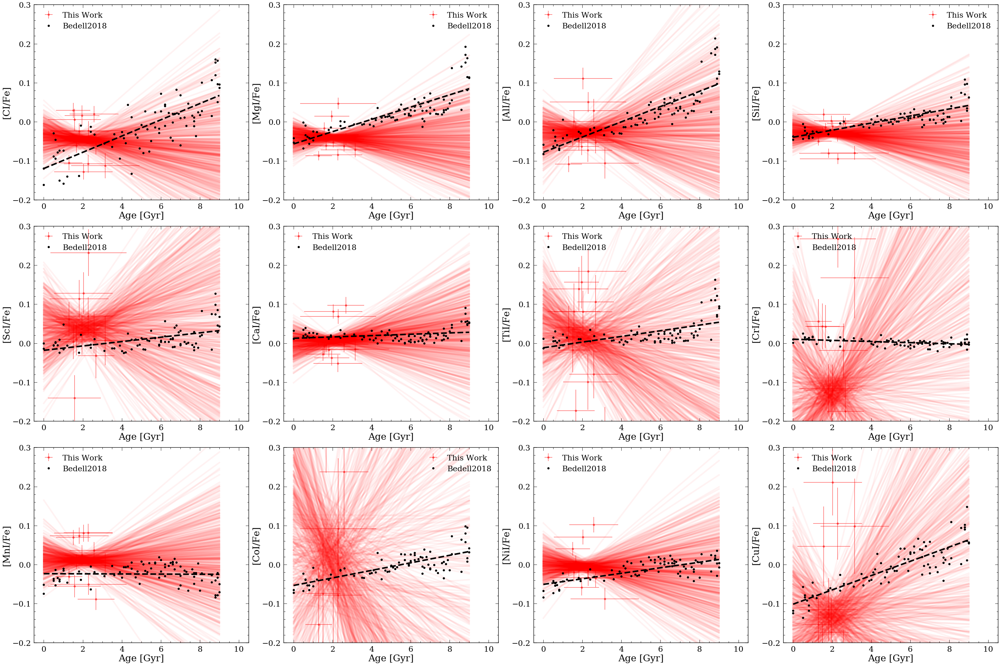

In [57]:
plt.figure(figsize=(45,30))
for i in range(len(abun_apog)):
    update_progress(i/len(abun_apog))
    df_plot=df_st.loc[df_st[abun_apog[i]]>-100]
    df_plot=df_plot.reset_index(drop=True)
    df_plot=df_plot.dropna(subset=['kin_age','kin_age_err'])
    plt.subplot(3,4,i+1)
    
    #err=np.power(df_plot[abun_apog[i]+"_ERR"],2.)+np.power(df_plot["age_STD_err"],2.)
    err=np.power(df_plot[abun_apog[i]+"_ERR"],2.)
    
    
    plt.errorbar(df_plot['kin_age'],df_plot[abun_apog[i]],yerr=df_plot[abun_apog[i]+"_ERR"],
                 xerr=df_plot["kin_age_err"],fmt='ro',label='This Work',alpha=0.5)
    """
    plt.errorbar(df_plot['age_MAD'],df_plot[abun_apog[i]],yerr=df_plot[abun_apog[i]+"_ERR"],fmt='ro',label='This Work',alpha=0.5)
    """
    
    z = np.polyfit(df_plot['kin_age'],df_plot[abun_apog[i]],1)
    p = np.poly1d(z)
    #plt.plot(range(10),p(range(10)),'r--',linewidth=5)
        
    for k in range(500):
        new_age_mock=np.array([np.random.normal(df_plot.iloc[j]['kin_age'],
                        df_plot.iloc[j]['kin_age_err']) for j in range(len(df_plot))])
        new_abun_mock=np.array([np.random.normal(df_plot.iloc[j][abun_apog[i]], 
                        df_plot.iloc[j][abun_apog[i]+"_ERR"]) for j in range(len(df_plot))])
        z = np.polyfit(new_age_mock,new_abun_mock,1)
        p = np.poly1d(z)
        plt.plot(range(10),p(range(10)),'r-',linewidth=5,alpha=0.05)
    
    z = np.polyfit(df_st_md['Agemp'], df_st_md[abund[abun_apog[i]]+'H]']-df_st_md['[Fe/H]'],1)
    p = np.poly1d(z)
    
    plt.errorbar(df_st_md['Agemp'],df_st_md[abund[abun_apog[i]]+'H]']-df_st_md['[Fe/H]'],
                 fmt='ko',label='Bedell2018')
    plt.plot(range(10),p(range(10)),'k--',linewidth=5)
    
    
    plt.ylim([-0.2,0.3])
    plt.xlim([-0.5,10.5])
    plt.ylabel(abund[abun_apog[i]]+'Fe]')
    plt.xlabel('Age [Gyr]')
    plt.legend()
plt.tight_layout()
plt.savefig('Abundances.png')
    
    

## Ages for stars with predicted Prot

In [4]:
#df_bin_rotrvar=pd.read_pickle('../KeplerAge_cut.pkl')
df_bin_rotrvar=pd.read_pickle('../KinageAllKepler_cut.pkl')
df_bin_rotrvar=df_bin_rotrvar.loc[df_bin_rotrvar['abs_G']>4]
APOGEE=pd.read_pickle('/Users/lucy/Desktop/ASTR/Columbia/GalacticArch/APOGEE.pkl')
#df_bin_rotrvar.to_pickle('../KeplerAge_correct.pkl')


In [5]:
len(df_bin_rotrvar)

75480

In [41]:
df_st_rotrvar=pd.merge(APOGEE,df_bin_rotrvar,left_on='GAIA_SOURCE_ID',right_on='source_id',how='inner')

df_st_rotrvar=df_st_rotrvar.loc[abs(df_st_rotrvar['FE_H'])<=0.3]
df_st_rotrvar=df_st_rotrvar.loc[abs(df_st_rotrvar['teff_calc']-5778)<=100]
df_st_rotrvar=df_st_rotrvar.loc[abs(df_st_rotrvar['LOGG']-4.43)<=0.1]
print(len(df_st_rotrvar))


df_ka=pd.read_table('../BedellAbund.csv',delimiter=',')
df_ka.HIP=[int(i) for i in df_ka.HIP.values]
df_ka_age=pd.read_table('../Bedell_age.csv',delimiter=',')
df_ka_age.HIP=[int(i) for i in df_ka_age.HIP.values]
df_fe=pd.read_table('../Bedell_Fe.csv',delimiter=',')
df_fe.HIP=[int(i) for i in df_fe.HIP.values]

108


In [42]:
df_st_md=pd.merge(df_ka,df_ka_age,left_on='HIP',right_on='HIP',how='inner')
df_st_md=pd.merge(df_st_md,df_fe,left_on='HIP',right_on='HIP',how='inner')
df_st_md.columns

Index(['HIP', '[CI/H]', '[CH/H]', '[OI/H]', '[NaI/H]', '[MgI/H]', '[AlI/H]',
       '[SiI/H]', '[SI/H]', '[CaI/H]', '[ScI/H]', '[ScII/H]', '[TiI/H]',
       '[TiII/H]', '[VI/H]', '[CrI/H]', '[CrII/H]', '[MnI/H]', '[CoI/H]',
       '[NiI/H]', '[CuI/H]', '[ZnI/H]', '_RA', '_DE', 'recno', 'e_[ZnI/H]',
       'e_[VI/H]', 'e_[TiII/H]', 'e_[SiI/H]', 'e_[TiI/H]', 'e_[SI/H]',
       'e_[ScII/H]', 'e_[ScI/H]', 'e_[OI/H]', 'e_[NiI/H]', 'e_[NaI/H]',
       'e_[MnI/H]', 'e_[MgI/H]', 'e_[CuI/H]', 'e_[AlI/H]', 'e_[CaI/H]',
       'e_[CH/H]', 'e_[CI/H]', 'e_[CoI/H]', 'e_[CrI/H]', 'e_[CrII/H]',
       'RAJ2000_x', 'DEJ2000_x', 'Agemp', 'AgeLL1s', 'AgeUL1s', 'AgeLL2s',
       'AgeUL2s', 'Agemean', 'Agestd', 'Massmp', 'MassLL1s', 'MassUL1s',
       'MassLL2s', 'MassUL2s', 'MassMean', 'MassStd', 'RAJ2000_y', 'DEJ2000_y',
       'SNR', 'Teff', 'e_Teff', 'logg', 'e_logg', '[Fe/H]', 'e_[Fe/H]', 'Xi',
       'e_Xi'],
      dtype='object')

100%|██████████| 12/12 [00:00<00:00, 20.55it/s]


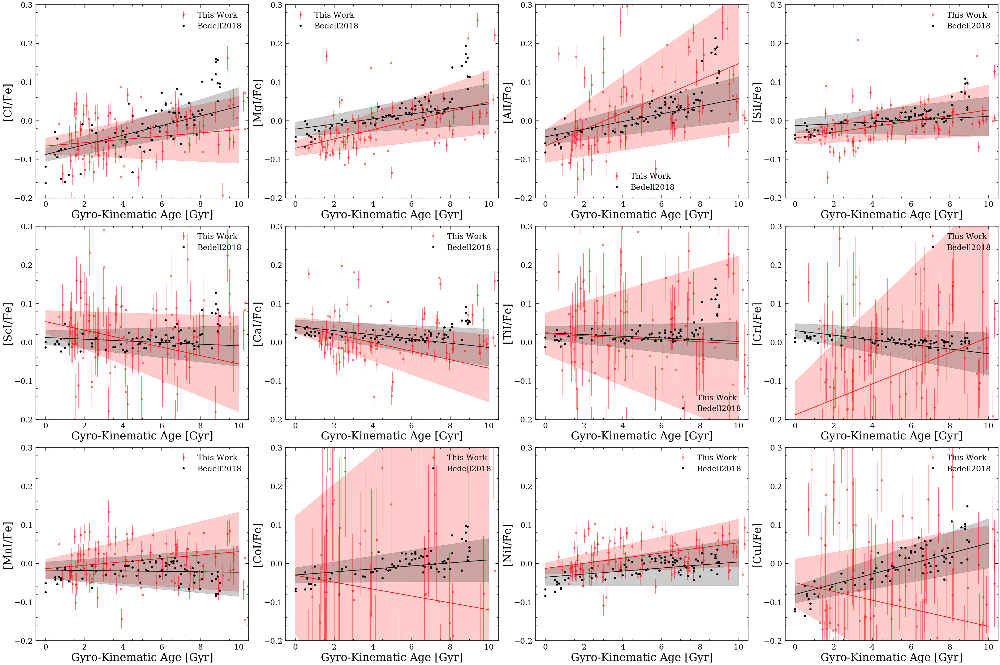

In [47]:
plt.figure(figsize=(45,30))
for i in trange(len(abun_apog)):
    df_plot=df_st_rotrvar.loc[df_st_rotrvar[abun_apog[i]]>-100]
    df_plot=df_plot.reset_index(drop=True)
    #df_plot=df_plot.dropna(subset=['kin_age_mix','kin_age_mix_err'])
    #df_plot=df_plot.dropna(subset=['kin_age_correct'])
    df_plot=df_plot.dropna(subset=['kin_age'])
    plt.subplot(3,4,i+1)
    
    #err=np.power(df_plot[abun_apog[i]+"_ERR"],2.)+np.power(df_plot["age_STD_err"],2.)
    err=np.power(df_plot[abun_apog[i]+"_ERR"],2.)
    
    """
    plt.errorbar(df_plot['kin_age_mix'],df_plot[abun_apog[i]],yerr=df_plot[abun_apog[i]+"_ERR"],
                 xerr=df_plot["kin_age_mix_err"],fmt='ro',label='This Work',alpha=0.5)
    """
    plt.errorbar(df_plot['kin_age_mix'],df_plot[abun_apog[i]],yerr=df_plot[abun_apog[i]+"_ERR"],fmt='ro',label='This Work',alpha=0.5)
    
    
    mask=df_plot['kin_age_mix']+df_plot['kin_age_mix_err']<8
    #mask=df_plot['kin_age_mix']<8
    
    df_plot_fit=df_plot[mask]
    
    p, cov = np.polyfit(df_plot_fit['kin_age_mix'].values, df_plot_fit[abun_apog[i]], 1,cov=True)
    slope, intercept = p
    slope_err, intercept_err = np.sqrt(np.diag(cov))
    plt.plot([0,10],slope*np.array([0,10])+intercept,c='r')
    plt.fill_between([0,10],(slope+slope_err)*np.array([0,10])+(intercept+intercept_err),
                    (slope-slope_err)*np.array([0,10])+(intercept-intercept_err),color='r',alpha=0.2)
    
    df_st_md_fit=df_st_md.loc[df_st_md['Agemp']<8]
    
    p, cov = np.polyfit(df_st_md_fit['Agemp'].values, df_st_md_fit[abund[abun_apog[i]]+'H]'], 1,cov=True)
    slope, intercept = p
    slope_err, intercept_err = np.sqrt(np.diag(cov))
    plt.plot([0,10],slope*np.array([0,10])+intercept,c='k')
    plt.fill_between([0,10],(slope+slope_err)*np.array([0,10])+(intercept+intercept_err),
                    (slope-slope_err)*np.array([0,10])+(intercept-intercept_err),color='k',alpha=0.2)

    
    plt.errorbar(df_st_md['Agemp'],df_st_md[abund[abun_apog[i]]+'H]']-df_st_md['[Fe/H]'],
                 fmt='ko',label='Bedell2018')
    #plt.plot(range(10),p(range(10)),'k--',linewidth=5)
    
    
    plt.ylim([-0.2,0.3])
    plt.xlim([-0.5,10.5])
    plt.ylabel(abund[abun_apog[i]]+'Fe]',fontsize=35)
    plt.xlabel('Gyro-Kinematic Age [Gyr]',fontsize=35)
    plt.legend()
plt.tight_layout()
plt.savefig('Abundances_protrvar.png')
    
    

## For Rvar

In [243]:
df_st_rvar=pd.merge(APOGEE,df_bin_rvar,left_on='GAIA_SOURCE_ID',right_on='source_id',how='inner')

df_st_rvar=df_st_rvar.loc[abs(df_st_rvar['FE_H'])<=0.3]
df_st_rvar=df_st_rvar.loc[abs(df_st_rvar['teff_calc']-5778)<=100]
df_st_rvar=df_st_rvar.loc[abs(df_st_rvar['LOGG']-4.43)<=0.1]
print(len(df_st_rvar))
df_ka=pd.read_table('../BedellAbund.csv',delimiter=',')
df_ka.HIP=[int(i) for i in df_ka.HIP.values]
df_ka_age=pd.read_table('../Bedell_age.csv',delimiter=',')
df_ka_age.HIP=[int(i) for i in df_ka_age.HIP.values]
df_fe=pd.read_table('../Bedell_Fe.csv',delimiter=',')
df_fe.HIP=[int(i) for i in df_fe.HIP.values]

68


In [244]:
df_st_md=pd.merge(df_ka,df_ka_age,left_on='HIP',right_on='HIP',how='inner')
df_st_md=pd.merge(df_st_md,df_fe,left_on='HIP',right_on='HIP',how='inner')
df_st_md.columns

Index(['HIP', '[CI/H]', '[CH/H]', '[OI/H]', '[NaI/H]', '[MgI/H]', '[AlI/H]',
       '[SiI/H]', '[SI/H]', '[CaI/H]', '[ScI/H]', '[ScII/H]', '[TiI/H]',
       '[TiII/H]', '[VI/H]', '[CrI/H]', '[CrII/H]', '[MnI/H]', '[CoI/H]',
       '[NiI/H]', '[CuI/H]', '[ZnI/H]', '_RA', '_DE', 'recno', 'e_[ZnI/H]',
       'e_[VI/H]', 'e_[TiII/H]', 'e_[SiI/H]', 'e_[TiI/H]', 'e_[SI/H]',
       'e_[ScII/H]', 'e_[ScI/H]', 'e_[OI/H]', 'e_[NiI/H]', 'e_[NaI/H]',
       'e_[MnI/H]', 'e_[MgI/H]', 'e_[CuI/H]', 'e_[AlI/H]', 'e_[CaI/H]',
       'e_[CH/H]', 'e_[CI/H]', 'e_[CoI/H]', 'e_[CrI/H]', 'e_[CrII/H]',
       'RAJ2000_x', 'DEJ2000_x', 'Agemp', 'AgeLL1s', 'AgeUL1s', 'AgeLL2s',
       'AgeUL2s', 'Agemean', 'Agestd', 'Massmp', 'MassLL1s', 'MassUL1s',
       'MassLL2s', 'MassUL2s', 'MassMean', 'MassStd', 'RAJ2000_y', 'DEJ2000_y',
       'SNR', 'Teff', 'e_Teff', 'logg', 'e_logg', '[Fe/H]', 'e_[Fe/H]', 'Xi',
       'e_Xi'],
      dtype='object')

In [245]:
abun_apog=['C_FE','MG_FE','AL_FE','SI_FE','S_FE','CA_FE','TI_FE','CR_FE','MN_FE','CO_FE',
       'NI_FE','CU_FE']

abund={'C_FE':'[CI/','MG_FE':'[MgI/','AL_FE':'[AlI/','SI_FE':'[SiI/','S_FE':'[ScI/',
       'CA_FE':'[CaI/','TI_FE':'[TiI/','CR_FE':'[CrI/','MN_FE':'[MnI/','CO_FE':'[CoI/',
       'NI_FE':'[NiI/','CU_FE':'[CuI/'}

In [140]:
plt.figure(figsize=(45,30))
for i in range(len(abun_apog)):
    update_progress(i/len(abun_apog))
    df_plot=df_st_rvar.loc[df_st_rvar[abun_apog[i]]>-100]
    df_plot=df_plot.reset_index(drop=True)
    df_plot=df_plot.dropna(subset=['kin_age','kin_age_err'])
    plt.subplot(3,4,i+1)
    
    #err=np.power(df_plot[abun_apog[i]+"_ERR"],2.)+np.power(df_plot["age_STD_err"],2.)
    err=np.power(df_plot[abun_apog[i]+"_ERR"],2.)
    
    
    plt.errorbar(df_plot['kin_age'],df_plot[abun_apog[i]],yerr=df_plot[abun_apog[i]+"_ERR"],
                 xerr=df_plot["kin_age_err"],fmt='ro',label='This Work',alpha=0.5)
    """
    plt.errorbar(df_plot['age_MAD'],df_plot[abun_apog[i]],yerr=df_plot[abun_apog[i]+"_ERR"],fmt='ro',label='This Work',alpha=0.5)
    """
    
    z = np.polyfit(df_plot['kin_age'],df_plot[abun_apog[i]],1)
    p = np.poly1d(z)
    #plt.plot(range(10),p(range(10)),'r--',linewidth=5)
        
    for k in range(500):
        new_age_mock=np.array([np.random.normal(df_plot.iloc[j]['kin_age'],
                        df_plot.iloc[j]['kin_age_err']) for j in range(len(df_plot))])
        new_abun_mock=np.array([np.random.normal(df_plot.iloc[j][abun_apog[i]], 
                        df_plot.iloc[j][abun_apog[i]+"_ERR"]) for j in range(len(df_plot))])
        z = np.polyfit(new_age_mock,new_abun_mock,1)
        p = np.poly1d(z)
        plt.plot(range(10),p(range(10)),'r-',linewidth=5,alpha=0.05)
    
    z = np.polyfit(df_st_md['Agemp'], df_st_md[abund[abun_apog[i]]+'H]']-df_st_md['[Fe/H]'],1)
    p = np.poly1d(z)
    
    plt.errorbar(df_st_md['Agemp'],df_st_md[abund[abun_apog[i]]+'H]']-df_st_md['[Fe/H]'],
                 fmt='ko',label='Bedell2018')
    plt.plot(range(10),p(range(10)),'k--',linewidth=5)
    
    
    plt.ylim([-0.2,0.3])
    plt.xlim([-0.5,10.5])
    plt.ylabel(abund[abun_apog[i]]+'Fe]')
    plt.xlabel('Age [Gyr]')
    plt.legend()
plt.tight_layout()
plt.savefig('Abundances_rvar.png')
    
    

Progress: [--------------------] 0.0%


NameError: name 'df_st_rvar' is not defined

<Figure size 3240x2160 with 0 Axes>

# cross-match 2 Prot and Rvar ages

In [162]:
ages_cm=pd.merge(df_bin,df_bin_rvar,left_on='KID',right_on='KID',how='inner')
ages_cm

,KIC_x,iso_mass_x,iso_mass_err1_x,iso_mass_err2_x,iso_teff_x,iso_teff_err1_x,iso_teff_err2_x,iso_logg_x,iso_logg_err1_x,iso_logg_err2_x,...,kepid_y_y,X_y,Y_y,z_y,R_y,parallax_y,kepid_y,v_t_y,Lz_est_y,kin_age_Sharma2020_y
0,892834,0.751,0.034,-0.039,4823.2,90.4,-82.2,4.587,0.023,-0.028,...,892834.0,0.197754,-0.522096,0.095666,8.019260,1.737008,892834.0,16.909004,135.597695,0.445367
1,893033,0.685,0.027,-0.030,4707.6,87.6,-82.5,4.636,0.018,-0.023,...,893033.0,0.181023,-0.479249,0.087658,8.033285,1.895564,893033.0,48.426129,389.020919,0.239424
2,893286,0.853,0.047,-0.057,5297.1,103.4,-98.5,4.522,0.034,-0.044,...,893286.0,0.291803,-0.773411,0.140845,7.945926,1.164493,893286.0,14.108767,112.107220,1.196577
3,893383,0.912,0.036,-0.051,5680.9,105.1,-102.2,4.526,0.020,-0.031,...,893383.0,0.221820,-0.587197,0.106613,7.999760,1.542009,893383.0,39.187417,313.489921,0.307906
4,893559,0.808,0.044,-0.049,5095.3,95.2,-88.7,4.546,0.033,-0.041,...,893559.0,0.325921,-0.865599,0.157034,7.921514,1.038447,893559.0,8.625127,68.324064,1.367114
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23266,12884445,0.654,0.023,-0.015,4237.0,67.8,-43.9,4.626,0.021,-0.033,...,12884445.0,0.043604,-0.375772,0.116840,8.165047,2.497090,12884445.0,68.123474,556.231385,0.110108
23267,12884566,0.889,0.057,-0.063,5434.9,100.0,-98.9,4.479,0.039,-0.048,...,12884566.0,0.098036,-0.856592,0.266211,8.147121,1.079699,12884566.0,25.883677,210.877439,0.581440
23268,12884971,0.640,0.018,-0.015,4218.2,72.9,-41.3,4.640,0.021,-0.037,...,12884971.0,0.042869,-0.377033,0.116128,8.165840,2.491312,12884971.0,62.996271,514.417443,0.043262
23269,12934465,0.750,0.036,-0.036,4769.3,83.6,-76.0,4.579,0.026,-0.027,...,12934465.0,0.070263,-0.623255,0.193567,8.153593,1.494925,12934465.0,64.961322,529.668160,0.103999


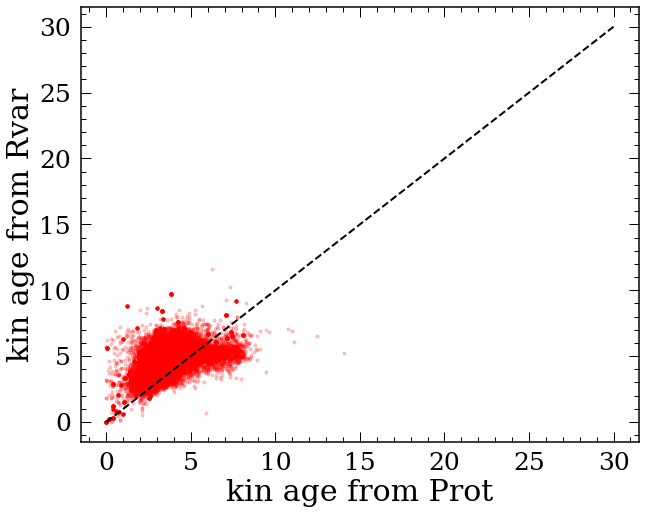

In [163]:
plt.figure(figsize=(10,8))
plt.plot(ages_cm['kin_age_x'],ages_cm['kin_age_y'],'r.',alpha=0.2)
plt.xlabel('kin age from Prot')
plt.ylabel('kin age from Rvar')
plt.plot([0,30],[0,30],'k--')

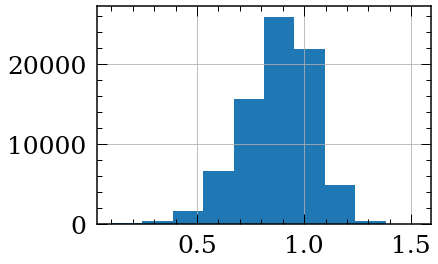

In [129]:
df_bin_rotrvar['mass'].hist()

In [130]:
df_bin_rotrvar['mass'].median()

0.896

In [58]:
allages=pd.read_pickle('../KinageAllKepler.pkl')

In [59]:
all1=pd.merge(pd.read_pickle('/Users/lucy/Desktop/FirstYearML/Mc_Gar_Sant'),allages[['KID','teff_calc','abs_G']],
              left_on='KID',right_on='KID',how='inner')
all1
              

,CP/CB_candidate_flag,DC,E_M,E_Teff,E_logg,FQ,Flag,FliPer_Class,GAIA_inary_flag,GAIA_subgiant_flag,...,teff_percentile_upper,teff_prov,teff_val,tm_designation,visibility_periods_used,w,v_b,v_tan,teff_calc,abs_G
0,NaN,1.0,NaN,NaN,NaN,NaN,---,NaN,NaN,NaN,...,4269.720215,PHO2,3823.333252,2MASS J19252036+3648231,15.0,0.5445,-11.929150,20.490185,3892.908102,7.386176
1,NaN,0.0,NaN,NaN,NaN,NaN,---,NaN,NaN,NaN,...,4525.220215,PHO1,4239.220215,2MASS J19263622+3650126,15.0,0.3939,13.596025,17.989548,4048.484918,7.526546
2,NaN,0.0,NaN,NaN,NaN,NaN,---,NaN,NaN,NaN,...,4850.009766,PHO1,4457.000000,2MASS J19275003+3659585,15.0,0.5124,16.651520,22.581097,4316.554097,6.985246
3,NaN,0.0,NaN,NaN,NaN,NaN,---,NaN,NaN,NaN,...,4484.669922,PHO1,4263.983398,2MASS J19232013+3704289,12.0,0.5839,-6.969535,18.227238,4252.863132,7.145322
4,NaN,0.0,NaN,NaN,NaN,NaN,---,NaN,NaN,NaN,...,4721.000000,SPE68,4447.000000,2MASS J19234550+3700228,14.0,0.2563,12.197629,31.422740,4369.082167,7.019746
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32961,1.0,NaN,0.027,67.0,0.036,17.0,NaN,2.0,0.0,0.0,...,3969.459961,PHO2,3774.500000,2MASS J19214456+5210410,17.0,NaN,-3.861716,9.081078,3863.597356,7.415637
32962,-999.0,NaN,0.059,136.0,0.025,17.0,NaN,0.0,0.0,0.0,...,5107.000000,PHO1,4995.666504,2MASS J19182351+5213445,15.0,NaN,-1.212178,3.229439,5122.906288,5.791401
32963,-999.0,NaN,0.051,150.0,0.032,17.0,NaN,0.0,0.0,0.0,...,4485.220215,KIC0,4307.020020,2MASS J19185484+5212276,17.0,NaN,-35.372596,68.123474,4163.624695,7.273013
32964,-999.0,NaN,0.062,164.0,0.099,17.0,NaN,0.0,0.0,0.0,...,4853.950195,PHO1,4745.840332,2MASS J19204780+5214565,16.0,NaN,6.894063,8.393855,4913.201762,5.921486


In [52]:
def m_to_M(m, D):
    """
    Convert apparent magnitude to absolute magnitude.
    """
    return m - 5*np.log10(D)-10
all1['abs_G']=m_to_M(all1.phot_g_mean_mag.values, 1./all1['parallax'])



/Users/lucy/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [64]:
all1.loc[all1['teff_calc']<8000]

,CP/CB_candidate_flag,DC,E_M,E_Teff,E_logg,FQ,Flag,FliPer_Class,GAIA_inary_flag,GAIA_subgiant_flag,...,teff_percentile_upper,teff_prov,teff_val,tm_designation,visibility_periods_used,w,v_b,v_tan,teff_calc,abs_G
0,NaN,1.0,NaN,NaN,NaN,NaN,---,NaN,NaN,NaN,...,4269.720215,PHO2,3823.333252,2MASS J19252036+3648231,15.0,0.5445,-11.929150,20.490185,3892.908102,7.386176
1,NaN,0.0,NaN,NaN,NaN,NaN,---,NaN,NaN,NaN,...,4525.220215,PHO1,4239.220215,2MASS J19263622+3650126,15.0,0.3939,13.596025,17.989548,4048.484918,7.526546
2,NaN,0.0,NaN,NaN,NaN,NaN,---,NaN,NaN,NaN,...,4850.009766,PHO1,4457.000000,2MASS J19275003+3659585,15.0,0.5124,16.651520,22.581097,4316.554097,6.985246
3,NaN,0.0,NaN,NaN,NaN,NaN,---,NaN,NaN,NaN,...,4484.669922,PHO1,4263.983398,2MASS J19232013+3704289,12.0,0.5839,-6.969535,18.227238,4252.863132,7.145322
4,NaN,0.0,NaN,NaN,NaN,NaN,---,NaN,NaN,NaN,...,4721.000000,SPE68,4447.000000,2MASS J19234550+3700228,14.0,0.2563,12.197629,31.422740,4369.082167,7.019746
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32961,1.0,NaN,0.027,67.0,0.036,17.0,NaN,2.0,0.0,0.0,...,3969.459961,PHO2,3774.500000,2MASS J19214456+5210410,17.0,NaN,-3.861716,9.081078,3863.597356,7.415637
32962,-999.0,NaN,0.059,136.0,0.025,17.0,NaN,0.0,0.0,0.0,...,5107.000000,PHO1,4995.666504,2MASS J19182351+5213445,15.0,NaN,-1.212178,3.229439,5122.906288,5.791401
32963,-999.0,NaN,0.051,150.0,0.032,17.0,NaN,0.0,0.0,0.0,...,4485.220215,KIC0,4307.020020,2MASS J19185484+5212276,17.0,NaN,-35.372596,68.123474,4163.624695,7.273013
32964,-999.0,NaN,0.062,164.0,0.099,17.0,NaN,0.0,0.0,0.0,...,4853.950195,PHO1,4745.840332,2MASS J19204780+5214565,16.0,NaN,6.894063,8.393855,4913.201762,5.921486


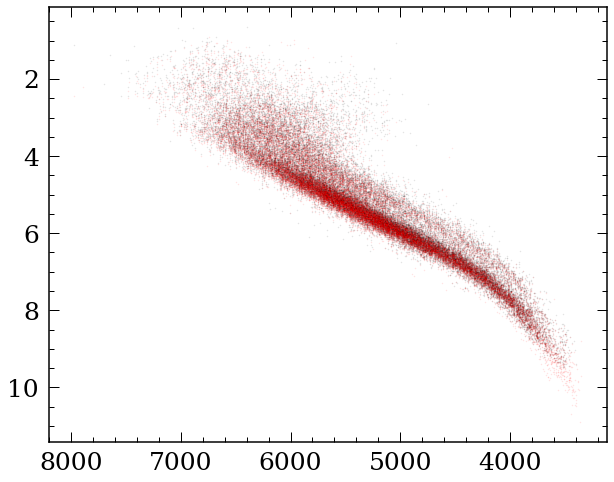

In [62]:
plt.figure(figsize=(10,8))
plt.plot(all1['teff_calc'],all1['abs_G'],'k.',markersize=1,alpha=0.1)
plt.plot(df_bin['color_teffs'],df_bin['abs_G'],'r.',markersize=1,alpha=0.1)
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()

In [35]:
df_bin['kin_age_percent']=df_bin['kin_age_err']/df_bin['kin_age']

In [54]:
df_bin_rotrvar=df_bin_rotrvar.dropna(subset=['kin_age','kin_age_err'])
df_bin_rotrvar['kin_age_percent']=df_bin_rotrvar['kin_age_err']/df_bin_rotrvar['kin_age']

/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


0.45819104689800144


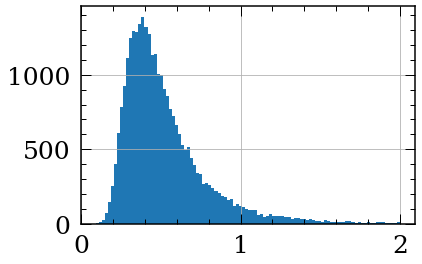

In [62]:
df_bin=df_bin.loc[df_bin['kin_age_percent']<2]
df_bin['kin_age_percent'].hist(bins=100)
print(np.median(df_bin['kin_age_percent']))

0.48832766860551075


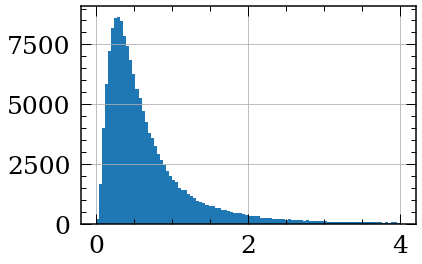

In [63]:
df_bin_rotrvar=df_bin_rotrvar.loc[df_bin_rotrvar['kin_age_percent']<4]
df_bin_rotrvar['kin_age_percent'].hist(bins=100)
print(np.median(df_bin_rotrvar['kin_age_percent']))

In [52]:
df_bin_rotrvar=pd.read_pickle('../KinageAllKepler_cut.pkl')

#  Ages in different temp bin

235
3.069710693382433 2.8098270598910333


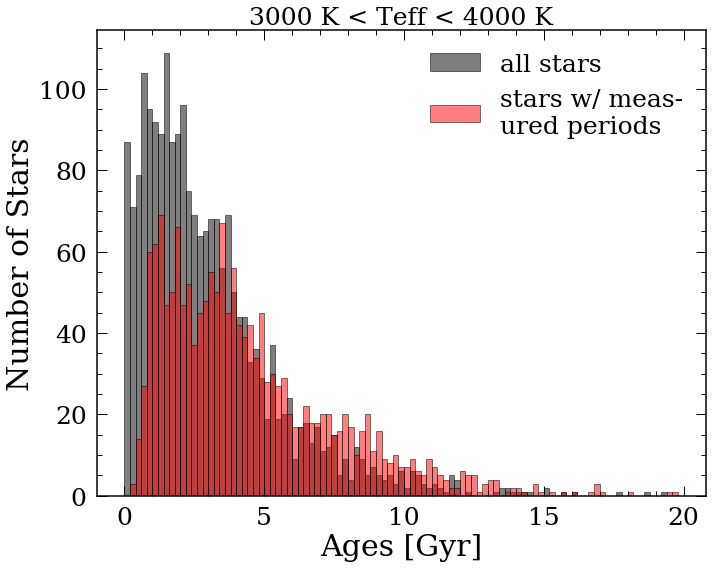

In [26]:
tempmin=3000
tempmax=4000
df_bin_rotrvar_plot=df_bin_rotrvar.loc[abs(df_bin_rotrvar['teff_calc']-(tempmin+tempmax)/2)<(tempmax-tempmin)/2]
both_df_plot=both_df.loc[abs(both_df['teff_calc']-(tempmin+tempmax)/2)<(tempmax-tempmin)/2]

plt.figure(figsize=(10,8))
bins=[i*(1/5) for i in range(100)]
plt.hist(df_bin_rotrvar_plot['kin_age_correct'],bins=bins,alpha=0.5,color='k',edgecolor='k',label='all stars')
plt.hist(both_df_plot['kin_age_mix'],bins=bins,alpha=0.5,color='r',edgecolor='k',label='stars w/ meas-\nured periods')
print(sum(df_bin_rotrvar['kin_age']>max(bins)))
#plt.yscale('log')
plt.ylabel('Number of Stars')
plt.xlabel('Ages [Gyr]')
plt.title('%d K < Teff < %d K'%(tempmin,tempmax),fontsize=25)
plt.legend(loc=1)
plt.tight_layout()
print(np.median(df_bin_rotrvar['kin_age_correct']),np.median(both_df['kin_age_mix']))
#plt.savefig('Age_recover_ac.png')






235
3.069710693382433 2.8098270598910333


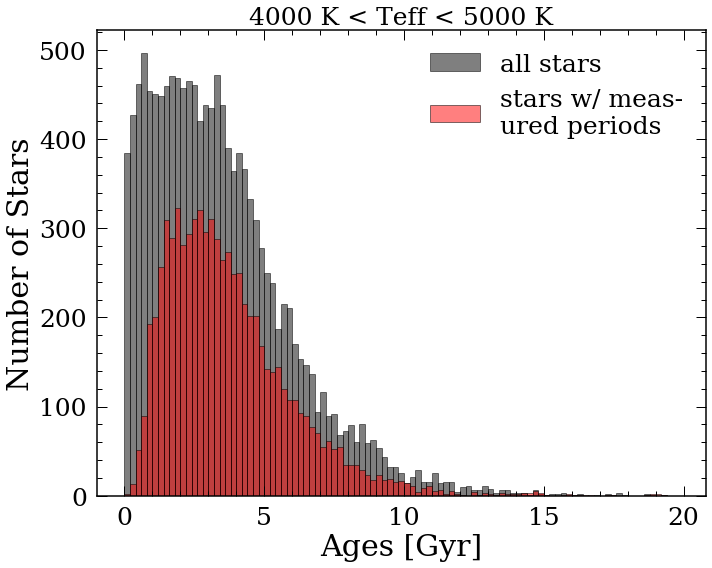

In [31]:
tempmin=4000
tempmax=5000
df_bin_rotrvar_plot=df_bin_rotrvar.loc[abs(df_bin_rotrvar['teff_calc']-(tempmin+tempmax)/2)<(tempmax-tempmin)/2]
both_df_plot=both_df.loc[abs(both_df['teff_calc']-(tempmin+tempmax)/2)<(tempmax-tempmin)/2]

plt.figure(figsize=(10,8))
bins=[i*(1/5) for i in range(100)]
plt.hist(df_bin_rotrvar_plot['kin_age_correct'],bins=bins,alpha=0.5,color='k',edgecolor='k',label='all stars')
plt.hist(both_df_plot['kin_age_mix'],bins=bins,alpha=0.5,color='r',edgecolor='k',label='stars w/ meas-\nured periods')
print(sum(df_bin_rotrvar['kin_age']>max(bins)))
#plt.yscale('log')
plt.ylabel('Number of Stars')
plt.xlabel('Ages [Gyr]')
plt.title('%d K < Teff < %d K'%(tempmin,tempmax),fontsize=25)
plt.legend(loc=1)
plt.tight_layout()
print(np.median(df_bin_rotrvar['kin_age_correct']),np.median(both_df['kin_age_mix']))
#plt.savefig('Age_recover_ac.png')







235
3.069710693382433 2.8098270598910333


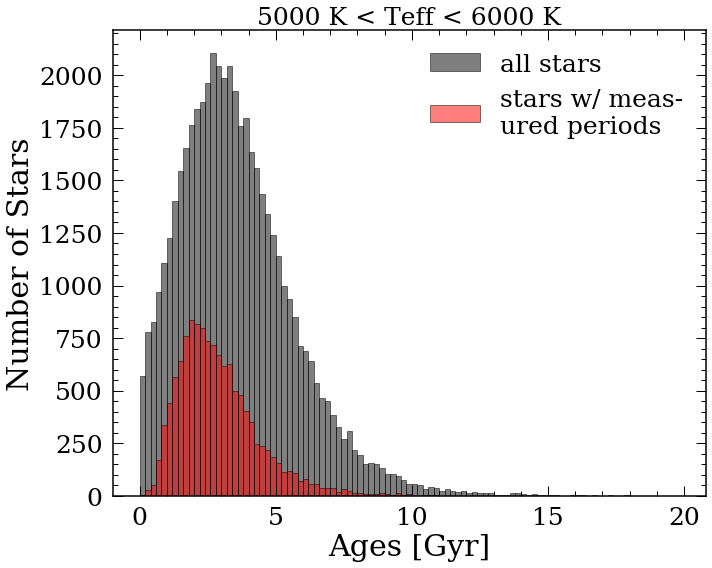

In [33]:
tempmin=5000
tempmax=6000
df_bin_rotrvar_plot=df_bin_rotrvar.loc[abs(df_bin_rotrvar['teff_calc']-(tempmin+tempmax)/2)<(tempmax-tempmin)/2]
both_df_plot=both_df.loc[abs(both_df['teff_calc']-(tempmin+tempmax)/2)<(tempmax-tempmin)/2]

plt.figure(figsize=(10,8))
bins=[i*(1/5) for i in range(100)]
plt.hist(df_bin_rotrvar_plot['kin_age_correct'],bins=bins,alpha=0.5,color='k',edgecolor='k',label='all stars')
plt.hist(both_df_plot['kin_age_mix'],bins=bins,alpha=0.5,color='r',edgecolor='k',label='stars w/ meas-\nured periods')
print(sum(df_bin_rotrvar['kin_age']>max(bins)))
#plt.yscale('log')
plt.ylabel('Number of Stars')
plt.xlabel('Ages [Gyr]')
plt.title('%d K < Teff < %d K'%(tempmin,tempmax),fontsize=25)
plt.legend(loc=1)
plt.tight_layout()
print(np.median(df_bin_rotrvar['kin_age_correct']),np.median(both_df['kin_age_mix']))
#plt.savefig('Age_recover_ac.png')








In [70]:
ages=pd.read_csv('Gyrokinage2020_Prot.csv',skiprows=1)

In [72]:
ages.columns

Index(['kepid', 'Prot', 'Prot_err', 'source_id', 'ra', 'ra_error', 'dec',
       'dec_error', 'all_vz', 'vz_err_all', 'vel_dis', 'kin_age',
       'kin_age_err_AVR', 'kin_age_err', 'kin_age_err_t', 'Ro', 'teff',
       'abs_G'],
      dtype='object')

In [8]:
def calc_age_err(v,a,da):
    return v**a*np.log(a)*da

In [13]:
np.median(calc_age_err(ages['vel_dis'],1.58,0.19)/ages['kin_age'])

1.4454270538229965

In [14]:
ages['kin_age_err_T']=np.sqrt(calc_age_err(ages['vel_dis'],1.58,0.19)**2+ages['kin_age_err']**2)

In [16]:
np.median(ages['kin_age_err_T'])/np.median(ages['kin_age'])

1.5387982914590723

In [19]:
mpf = '../aviary/data/metal_poor_avr.csv'
mrf = '../aviary/data/metal_rich_avr.csv'
af = '../aviary/data/all_stars_avr.csv'
def get_avr_coefficients():
    """
    Fit the parameters of the AVR using data from Yu & Liu:
    https://arxiv.org/pdf/1712.03965.pdf
    Fit to the relationship between log(sigma_z) and age.
    Returns:
        p_mp (array): coefficients [slope, intercept] for straight line fit to
            metal poor stars.
        p_mr (array): coefficients [slope, intercept] for straight line fit to
            metal rich stars.
        p_a (array): coefficients [slope, intercept] for straight line fit to
            all stars.
    """
    mp = pd.read_csv(mpf)
    mr = pd.read_csv(mrf)
    a = pd.read_csv(af)

    p_mp = np.polyfit(np.log(mp.sigma_z_kms), np.log(mp.Age_Gyr), 1)
    p_mr = np.polyfit(np.log(mr.sigma_z_kms), np.log(mr.Age_Gyr), 1)
    p_a = np.polyfit(np.log(a.sigma_z_kms), np.log(a.Age_Gyr), 1)

    return p_mp, p_mr, p_a

def v_to_age(v, coeffs):
    """
    Convert z velocity dispersion [km/s] to age [Gyr]
    Args:
        v (array): Z Velocity dispersion [km/s].
        coeffs (array): coefficients for straight line fit. [intercept, slope]
    Returns:
        age (array): age in Gyr.
    """
    b, a = coeffs
    logt = np.polyval(coeffs, np.log(v))
    return np.exp(logt)

In [20]:
p_mp, p_mr, p_a=get_avr_coefficients()

In [21]:
p_mr

array([ 1.57511484, -2.79934192])

In [26]:
test=500
newages=np.zeros((len(ages),500))
for i in range(test):
    p_mr[0]=np.random.normal(1.58, 0.19, 1)
    newages[:,i]=v_to_age(ages['vel_dis'], p_mr)


In [32]:
ageerr=np.array([np.std(newages[i,:]) for i in range(len(ages))])
#np.std(newages[0,:])

In [36]:
np.median((np.sqrt(ageerr**2+ages['kin_age_err']**2))/ages['kin_age'])

0.7603560232650199

In [95]:
star1=df_bin.loc[df_bin['kepid']==8410374]
star2=df_bin.loc[df_bin['kepid']==9848298]

29949


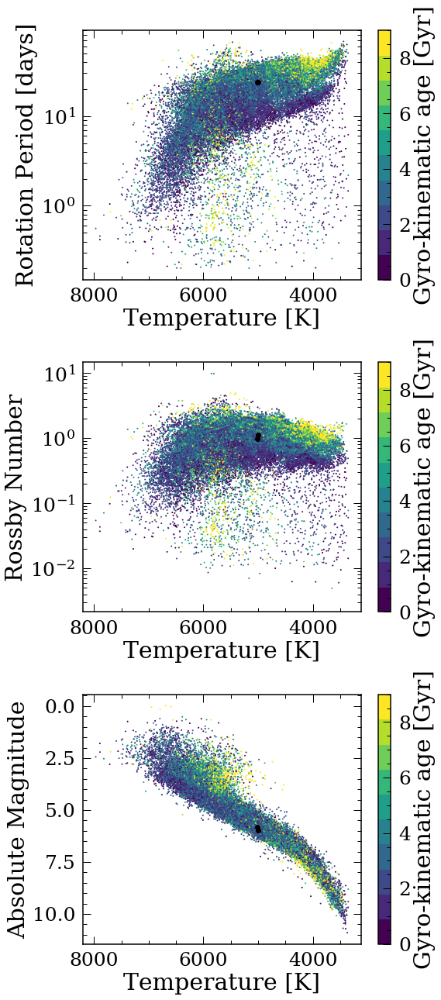

In [97]:
plt.figure(figsize=(8,18))
cm = plt.cm.get_cmap('viridis',10)
plt.subplot(3,1,1)
plt.scatter(df_bin['teff'],df_bin['Prot'],c=df_bin['kin_age'],s=1,vmin=0,vmax=9,cmap=cm,edgecolors=None)
plt.plot(star1['teff'],star1['Prot'],'ko')
plt.plot(star2['teff'],star2['Prot'],'ko')
plt.xlabel('Temperature [K]')
plt.gca().invert_xaxis()
plt.ylabel('Rotation Period [days]')

cb=plt.colorbar()
cb.set_label('Gyro-kinematic age [Gyr]')
#plt.title('Ages of stars in McQuillian2014+',fontsize=25)
plt.yscale('log')


plt.subplot(3,1,2)
plt.scatter(df_bin['teff'],df_bin['Ro'],c=df_bin['kin_age'],s=1,vmin=0,vmax=9,cmap=cm,edgecolors=None)
plt.plot(star1['teff'],star1['Ro'],'ko')
plt.plot(star2['teff'],star2['Ro'],'ko')
plt.xlabel('Temperature [K]')
plt.gca().invert_xaxis()
plt.ylabel('Rossby Number')

cb=plt.colorbar()
cb.set_label('Gyro-kinematic age [Gyr]')
#plt.title('Ages Errors',fontsize=25)
plt.tight_layout()
plt.yscale('log')

plt.subplot(3,1,3)
plt.scatter(df_bin['teff'],df_bin['abs_G'],c=df_bin['kin_age'],s=1,vmin=0,vmax=9,cmap=cm,edgecolors=None)
plt.plot(star1['teff'],star1['abs_G'],'ko')
plt.plot(star2['teff'],star2['abs_G'],'ko')
plt.xlabel('Temperature [K]')
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()
plt.ylabel('Absolute Magnitude')

cb=plt.colorbar()
cb.set_label('Gyro-kinematic age [Gyr]')
plt.tight_layout()
#plt.yscale('log')

#plt.savefig('Age_recover.png')
print(len(df_bin))

